# Trabajo Fin de Máster  
### Análisis de la Ciudad mediante Aprendizaje Supervisado  
#### Detección Automática de Tipologías Residenciales y Patrones de Cerramiento: Interpretabilidad vs Rendimiento

**Master Universitario en Ciencia de Datos e Ingeniería de Computadores (Universidad de Granada)**

> **Autor:** David Fernández Martínez    
> **Email personal:** david.fernxndez.martinez@gmail.com  
> **Email académico:** davidfm8@correo.ugr.es  
> **LinkedIn:** [linkedin.com/in/david-fernández-martínez](https://www.linkedin.com/in/david-fern%C3%A1ndez-mart%C3%ADnez/)  
> **GitHub:** [github.com/davidfernxndez](https://github.com/davidfernxndez)

---

## Análisis exploratorio de datos (EDA)

### 📝 Descripción del notebook
Este notebook presenta un análisis exploratorio de la base de datos de complejos residenciales del área metropolitana de Granada. Las tareas realizadas incluyen:

- Descripción de la base de datos y las variables que la componen.
- Presentación de los bloques temáticos en los que se agrupan las variables
- Análisis de las características descriptivas de la base de datos.
- Analisis exploratorio de la variable dependiente: clasificación de referencia.
- Análisis univariante de las variables independientes.
- Estudio de la relación entre cada variable independiente (predictora) y la variable objetivo.
- Estudio de la correlación entre las variables independientes 
- Definición del conjunto de datos con la matriz de variables utilizada en el entrenamiento y evaluación de los modelos de clasificación

### Indice de contenidos
1. [Descripción de la base de datos](#descripcion_database)
    * [1.1 Descripción de las variables](#descripcion_variables)
        * [1.1.1 Variable dependiente: Clasificación de referencia](#variable_dependiente_descripcion)
        * [1.1.2 Variables informativas o descriptivas](#variables_informativas_descripcion)
        * [1.1.3 Variables independientes (predictoras)](#variables_independientes_descripcion)    
 
2. [Análisis exploratorio de la variable dependiente](#variable_dependiente_eda)

3. [Análisis de las variables descriptivas](#variable_descriptivas_eda)
    * [3.1 Información general](#informacion_general)
        * [3.1.1 Identificador único de complejos residenciales](#identificador_unico)
        * [3.1.2 Distribución de los complejos residenciales por Municipio](#distribucion_municipio)
        * [3.1.3 Cartografía](#cartografia)    

    * [3.2 Características básicas](#caracteristicas_basicas)
        * [3.2.1 Año de construcción](#year)
        * [3.2.2 Superficie ocupada por el complejo residencial	](#superficie)
        * [3.2.3 Número de viviendas](#nviv)  

    * [3.3 Tipos de residencia y equipamientos comunes](#tipo_de_residencia)

4. [Análisis exploratorio de las variables independientes (predictoras)](#variable_predictoras_eda)
    * [4.1 Aspectos estructurales](#aspectos_estructurales)
        * [4.1.1 Tipos de calles](#tipos_de_calles)
        * [4.1.2 Tipos de comercios](#tipos_de_comercios)

    * [4.2 Distancia al núcleo úrbano principal](#distancia)
        * [4.2.1 Codificación de la variable DIS](#codificacion_distancia)

    * [4.3 Tipo de Cerramiento](#tipo_cerramiento)
    * [4.4 Puntos de acceso](#puntos_de_acceso)
    * [4.5 Uso de la vía pública](#via_publica)
    * [4.6 Seguridad y vigilancia](#seguridad)
    * [4.7. Relación entre las variables independientes (predictoras)](#variable_predictoras_correlacion)

5. [Construcción de los conjuntos de datos de trabajo](#construccion_datos)
    * [5.1 Conjunto de datos descriptivo](#datos_descriptivos)
    * [5.2 Conjunto de datos para entrenamiento y evaluación de modelos](#model_data)

6. [Anexo A: Análisis exploratorio de las variables descriptivas: Tipo de residencia y equipamientos comunes](#anexo_a)
    * [A.1 Tipo de residencia](#anexo_tipo_de_residencia)
    * [A.2 Equipamientos comunes](#equipamientos_comunes)

# Configuración de entorno e *imports*

Este proyecto ha sido realizado en un entorno Anaconda con la versión 3.11.15 de *Python*. Las versiones de las librerias requeridas se encuentran en el fichero *requirements.txt*.

En esta sección se importan las librerias necesarias para la ejecución de este fichero jupyter notebook, se activa el *reload* de módulos externos y se configuran aspectos globales y de reproducibilidad.

In [1]:
# jupyter extensions to automatically reload external modules
%load_ext autoreload
%autoreload 2

In [2]:
import os
import warnings
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Configuration object
from src.config import cfg

# Utility functions for Exploratory Data Analysis (EDA)
from src.EDA_utils import (
    plot_fix_map,
    categorical_bivariate_analysis,
    analyze_binary_cooccurrence,
    plot_univariate_distribution,
    plot_variable_occurrences,
    plot_boxplot,
    phi_correlation
)

**Import troubleshooting**

If the `src` imports fail when running this notebook in a different environment,
uncomment and execute the following cell:

```python
from pathlib import Path
import sys

PROJECT_ROOT = Path.cwd().parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
```

In [3]:
# Global configuration
sns.set_theme(style="ticks", context="notebook")
plt.rcParams["font.family"] = "sans-serif"
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
warnings.filterwarnings("ignore")

In [4]:
# Reproducibility
SEED = cfg.SEED 
np.random.seed(SEED)
random.seed(SEED)

<a id="descripcion_database"></a>
# 1. Descripción de la base de datos

La base de datos, de este trabajo, es el resultado de más de dos años de trabajo empírico dedicado a la identificación y cuantificación de complejos residenciales en el área metropolitana de Granada, hasta el año de 2022. La creación de esta base de datos responde a la escasez de estadísticas oficales fiables que permitan definir el grado de cerramiento de estos desarrollos urbanísticos y cuantificar de forma exhaustiva su presencia en el paisaje úrbano.

Tradicionalmente, el estudio de este fenómeno ha estado muy ligado a la identificación del modelo de comunidad cerrada (gated community) de Estados Unidos, centrado en viviendas unifamiliares con cerramientos físicos estrictos y altos niveles de seguridad. Sin embargo, la realidad urbana de las ciudades europeas presenta morfologías hibridas de mayor complejidad. En el caso de Granada, los complejos estrictamente cerrados representan menos del $10\%$ del total. Esto exige la recopilación de datos específicos que proporcionen información sobre mecanismos de aislamiento tanto físicos como estructurales y simbólicos.

Por este motivo, los investigadores han propuesto el concepto de complejo residencial (*residential compound*) como una alternativa más inclusiva y adaptable a la realidad española y europea. Este término permite englobar desarrollos urbanísticos cuyo aislamiento va más allá de una "fortificación física" estricamente cerrada.  Para que un desarrollo urbanístico sea considerado complejo residencial debe cumplir las siguientes dos condiciones:
* Existencia de instalaciones comunes de uso recreativo (piscinas, pistas deportivas, etc).
* Presencia de mecanisos de delimitación espacial, ya sean físicos o simbólicos, que separen la vida interna del entorno exterior.

Para construir la base de datos, se utilizaron dos fuentes principales de información digital, complementadas con trabajo de campo: 
* **Google Earth**. Se emplearon imágenes de satélite y el modo Street View para localizar los recintos desde una perspectiva aérea, prestando especial atención a la disponibilidad de instalaciones comunitarias (piscinas, pistas deportivas, parques infantiles, etc.), las cuales facilitan la identificación visual del fenómeno.
* **Sede electrónica del catastro**. Se utilizó para establecer los límites precisos de las parcelas y cuantificar tanto el número como el tipo de propiedades dentro de cada complejo
* **Visitas presenciales**. Los investigadores realizaron verificaciones in situ en aquellos casos donde los datos de las fuentes electrónicas resultaban incoherentes, limitados o insuficientes para asegurar la precisión de las variables registradas.

El resultado final de este proceso es un registro detallado de $642$ complejos residenciales, para los cuales se recopilaron $55$ variables observacionales organizadas en $10$ bloques temáticos A partir de esta información, los investigadores usaron su conocimiento experto en el dominio para realizar una clasificación tipológica del grado de cerramiento de los complejos residenciales. 

Esta tipología permite capturar la heterogeneidad morfológica de este fenómeno en las ciudades europeas. Asimismo, esta clasificación constituye una herramienta clave para el análisis de la fragmentación urbana, ya que permite identificar y caracterizar cómo la ciudad se divide en "islas" o enclaves residenciales que se aislan del resto del tejido úrbano.


La base de datos se encuentran en el directorio *data/raw/BD_complejos.xlsx* en formato excel. Cada fila se corresponde con un complejo residencial, mientras que cada columna representa una variable observacional.

In [5]:
# Read database from excel file
df = pd.read_excel(
    os.path.join(cfg.DATA_RAW_DIR, "BD_complejos.xlsx"),
    sheet_name="BD_complejos"
)
# Drop rows with all NaN values
df = df.dropna(how="all")

print("Base de datos leida correctamente.")
print(f"Número de complejos residenciales (filas) válidos: {df.shape[0]}") 
print(f"Número de variables (columnas) en la base de datos: {df.shape[1]}")
df

Base de datos leida correctamente.
Número de complejos residenciales (filas) válidos: 642
Número de variables (columnas) en la base de datos: 56


,CC,CPRO,MUN,CMUN,CDIS,CSEC,CCOM,CM,CD,MAN,LAT,LON,AÑO,AñoFin,AñoPri,SUP,NVIV,URB,CSS,CFS,CPE,LIN,LEX,VAI,VPA,VAD,PMC,PMA,CON,DIS,VER,MUR,CAD,BOL,ARB,CPP,PVI,PBL,COM,COMS,PPU,PRE,PPR,PIS,PTP,PBA,CFU,CGO,GIM,PAR,MOB,JAR,GSE,CSE,BSE,ASE
0,301014,18,ALBOLOTE,_003,_00301,1.800301e+09,14,3,1,2,440856.399,4126716.381,1954-2011,2011,1954.0,14519.63,61,1,0,0,0,0,1,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,1,1,1,0,1,0
1,301015,18,ALBOLOTE,_003,_00301,1.800301e+09,15,3,1,2,440502.598,4126703.923,1986,1986,NaN,6190.15,13,4,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,301016,18,ALBOLOTE,_003,_00301,1.800301e+09,16,3,1,2,440487.649,4126771.195,1986,1986,NaN,5006.58,10,4,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0
3,301017,18,ALBOLOTE,_003,_00301,1.800301e+09,17,3,1,2,440549.938,4126833.484,1986,1986,NaN,5196.59,10,4,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0
4,301018,18,ALBOLOTE,_003,_00301,1.800301e+09,18,3,1,2,440597.277,4126783.653,1986,1986,NaN,5079.12,10,4,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
637,91101006,18,VEGAS_DEL_GENIL,_911,_91101,1.891101e+09,6,911,1,0,438775.854,4114374.023,1986,1986,NaN,640.40,5,4,0,0,0,0,0,0,0,1,0,0,0,3,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
638,91101007,18,VEGAS_DEL_GENIL,_911,_91101,1.891101e+09,7,911,1,0,438764.534,4114420.719,1986,1986,NaN,869.28,10,4,0,0,0,0,0,0,0,1,0,0,0,3,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
639,91101002,18,VEGAS_DEL_GENIL,_911,_91101,1.891101e+09,2,911,1,0,439156.499,4114127.807,2007,2007,NaN,9332.00,50,4,0,1,0,0,0,0,0,1,0,0,0,3,1,1,0,0,0,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
640,91101003,18,VEGAS_DEL_GENIL,_911,_91101,1.891101e+09,3,911,1,0,439394.225,4114000.453,2007,2007,NaN,3688.00,17,4,0,0,0,0,0,0,0,1,0,0,0,3,1,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


Unicamente existen valores nulos (NaN) en la variable "AñoPri", como se muestra a continuación. En la siguiente sección se indica el motivo de estos valores faltantes.

In [6]:
# Count NaN values
nans = df.isna().sum()
print("Columnas con valores nulos (NaN):")
print(nans[nans > 0])

Columnas con valores nulos (NaN):
AñoPri    570
dtype: int64


<a id="descripcion_variables"></a>
## 1.1 Descripción de las variables

La base de datos está compuesta por $56$ variables, que se clasifican en tres grupos: variables descriptivas o informativas, variables predictoras y la variable dependiente.

<a id="variable_dependiente_descripcion"></a>
### 1.1.1 Variable dependiente: Clasificación de referencia

La variable dependiente de esta base de datos se denomina **URB** y representa la clasificación tipológica que define el grado de cerramiento del complejo residencial. Esta variable toma cinco posibles valores categóricos codificados con números enteros en el rango $[1,5]$, que representan en orden descendente la intensidad de cerramiento (siendo $1$ el valor más alto y $5$ el más bajo):

* **1 (Protegidos)**. Es el nivel más alto respecto a la intensidad del cerramiento. En estos complejos residenciales el control y la privacidad se garantizan mediante un perímetro totalmente delimitado por barreras físicas duras como muros o vallas. Además, cuentan con puntos de entrada comunitarios vigilados por servicios o mecanismos de seguridad.
  
* **2 (Controlados)**. Estos complejos presentan un cierre perimetral físico estricto con entrada limitada a residentes. Sin embargo, no cuentan con servicio de seguridad contratado ni mecanismos tecnológicos. De este modo, son los propios residentes quienes controlan quien entra y sale del complejo residencial.

  
* **3 (Autoaislados)**. Estos complejos residenciales están caracterizados por aislarse del exterior mediante un sistema de calles y carreteras. Si bien, la entrada al complejo es abierta, estos elementos actuan como dispositivos indirectos para desviar el flujo de no residentes.

  
* **4 (Individualista)**. La principal característica de estos complejos residenciales es que cuentan con un punto de acceso individual a cada vivienda. Esto dificulta el rastreo y control de quien entra al complejo residencial.

  
* **5 (Simbólicos)**. Estos complejos residenciales presentan un grado de aislamiento muy sutil o prácticamente inexistente. La entrada a estos edificios es abierta a no residentes y utilizan mecanismos de cerramiento menos agresivos.

Esta variable será la clase del problema de clasificación, con cinco niveles o etiquetas de clase.

In [7]:
# Se crea una columna con la etiqueta para los gráficos y tablas del EDA
map_label = mapping = {
    1: "Protegido",
    2: "Controlado",
    3: "Autoaislado",
    4: "Individualista",
    5: "Simbólico"
}
df["URB"] = df["URB"].astype(int)
df["URB_label"] = df["URB"].map(mapping)

# Se define el orden de acuerdo al grado de cerramiento
orden_urb_label = ["Protegido", "Controlado", "Autoaislado", "Individualista", "Simbólico"]
# Se define la variable como categorica para mostrarla ordenada en visualizaciones y tablas
df["URB_label"] = pd.Categorical(df["URB_label"],categories=orden_urb_label, ordered=True)

<a id="variables_informativas_descripcion"></a>
### 1.1.2 Variables informativas o descriptivas

Estas variables se han recopilado con fines descriptivos. Permiten identificar los complejos residencialesa nivel catastral, ubicarlos geograficamente y caracterizarlos a partir de información básica, como el número y tipo de viviendas o la superficie que ocupan, entre otros aspectos.

Por este motivo, estas variables no se han utilizado para la clasificación tipológica y no formarán parte del conjunto de datos empleado para entrenar y evaluar los modelos. Sin embargo, algunas de ellas sí se emplearán con fines de identificación, análisis o visualización.

Estas variables se agrupan en los siguientes cuatro bloques temáticos:

**Información general**

Las variables de este bloque contienen información administrativa que permite identificar al complejo residencial en términos urbanísticos:
* **CC**. Código del complejo completo (8 digitos) que identifica a un complejo residencial de forma única. Esta formado por la concatenación de las variables *CM (Código de Municipio)+CD (Código de distrito) +CCOM (Código del complejo)*.
* **CPRO**. Código de provincia. Al tratarse de complejos residenciales de la provincia de Granada, todos tiene valor $18$.
* **MUN**. Nombre del municipio.
* **CMUN**. Código de $3$ digitos del municipio. Se expresa en formato texto precedido por un guion bajo (e.j: _003).
* **CDIS**. Código del distrito censal de $2$ dígitos. Realmente la variable contiene los $3$ digitos del CMUN más los dos digitos propios del CDIS. Este código se utiliza para dividir municipios en áreas más pequeñas con fines demográficos y electorales. Se expresa en formato texto precedido por un guion bajo (e.j: _00301).
* **CSEC**. Código de sección censal de $10$ dígitos.
* **CCOM**. Código de $3$ dígitos que identifica al complejo residencial dentro del municipio.
* **CM**. Código del municipio en formato numérico (es el equivalente a CMUN sin el guion bajo que lo precede)
* **CD**. Código del distrito en formato numérico (es el equivalente al CDIS sin el guion bajo que lo precede)
* **MAN**. Esta variable indica si el complejo residencial es una mancomunidad (valor $2$) o no lo es (valor $0$). Una mancomunidad de propietarios es la agrupación de dos o más comunidades de vecinos, edificios o conjuntos inmobiliarios independientes que deciden unirse legalmente para gestionar, mantener y compartir elementos o servicios comunes.
* **LAT**. Coordenada de latitud expresada en sistema UTM usando el sistema geodésico de referencia ETRS89 en la zona 30N (hemisferio norte que cubre gran parte de la España peninsular occidental y central).
* **LON**. Coordenada de longitud expresada en sistema UTM usando el sistema geodésico de referencia ETRS89 en la zona 30N (hemisferio norte que cubre gran parte de la España peninsular occidental y central).

**Características básicas**

Las variables pertenecientes a este bloque describen información básica relativa al complejo residencial:
* **AÑO**. Año o periodo de años (separados por un guión) en los que el complejo residencial fue construido.
* **AñoFin**. Año en el que el complejo residencial fue construido completamente (última vivienda construida en el complejo).
* **AñoPri**. Año en el que se construyo la primera vivienda del complejo residencial. Aquellos complejos que fueron construidos en un solo año, no tiene valor en la columna AñoPri. Por ello hay un total de 570 valores NaN en esta columna.
* **SUP**. Superficie en metros cuadrados de la parcela que ocupa el complejo residencial.
* **NVIV**. Número de viviendas en el complejo residencial.

**Tipo de residencia**

Las variales de este bloque indican que tipo de viviendas existen en el complejo residencial. 
* **VAI**. Viviendas unifamiliares aisladas.
* **VPA**. Viviendas unifamiliares pareadas y otras.
* **VAD**. Viviendas unifamiliares adosadas.
* **PMC**. Pisos en manzana cerrada.
* **PMA**. Pisos en manzana abierta.
* **CON**. En construcción.

**Equipamientos comunes**

Las variables de este bloque indican que instalaciones comunes (piscinas, pistas deportivas, jardines,etc) están presentes en los complejos residenciales. La presencia de estos elementos es esencial para cumplir con la definición de complejo residencial planteada en la base de datos, es por ello que estas variables se recogen con fines descriptivos.
* **PIS**. Piscina.
* **PTP**. Pista de Tenis/Padel.
* **PBA**. Pista de Baloncesto.
* **CFU**. Campo de fútbol.
* **CGO**. Campo de Golf.
* **GIM**. Gimnasio.
* **PAR**. Parque Infantil.
* **MOB**. Patio con Mobiliario.
* **JAR**. Jardines/Parques.

<a id="variables_independientes_descripcion"></a>
### 1.1.3 Variables independientes (predictoras)

Estas variables observacionales fueron utilizadas por los investigadores para clasificar cada complejo residencial en uno de los cinco posibles grados de cerramiento. Se trata de variables categórico binarias (a excepción de la variable **DIS**) que indican con valor $1$ la presencia de dicha característica en el complejo residencial.

Se agrupan en los siguientes $6$ bloques temáticos:

**Aspectos estructurales**

Las variables de este bloque aportan información sobre la estructura del complejo residencial.
* **CSS**. Existencia de una calle sin salida. Una calle sin salida se caracteriza por terminar de forma abrupta (en línea recta o con un muro). Esto obliga a los vehículos a realizar maniobras de marcha atrás para poder salir.
* **CFS**. Existencia de calle en fondo de saco. Estas calles se caracterizan por no tener salida pero terminar con una rotonda o plazoleta que permite a los vehículos cambiar de dirección de forma comoda.
* **CPE**. Existencia de una calle peatonal.
* **LIN**. Existencia de comercios internos.
* **LEX**. Existencia de comercios externos.

**Distancia al núcleo urbano principal**

Este bloque está compuesto unicamente por la variable **DIS** que indica la distancia del complejo residencial al núcleo úrbano principal más cercano. La variable puede tomar los siguientes $3$ valores categóricos:
* **1**: Urbanización aislada.
* **2**: Urbanización separada.
* **3**: Urbanización integrada en casco urbano.

**Tipo de Cerramiento**

Las variables de este bloque indican el tipo de cerramiento que existe en el complejo residencial.
* **VER**. Verjas o Vallas.
* **MUR**. Muros.
* **CAD**. Cadenas.
* **BOL**. Bolardos.
* **ARB**. Arbustos.
* **CPP**. Carteles de propiedad privada.

**Puntos de acceso**

Las variables de este bloque indican la forma de acceder al complejo residencial.
* **PVI**. Entrada por vivienda.
* **PBL**. Entrada por bloque.
* **COM**. Entrada común a la urbanización
* **COMS**. Varias entradas comunes a la urbanización.

**Uso de la Via publica**

Las variables de este bloque especifican que tipo de uso de la via publica tiene el complejo residencial.
* **PPU**. Dominio público y de uso público.
* **PRE**. Dominio privado de uso público restringido.
* **PPR**. Dominio privado de uso privado.

**Seguridad y Vigilancia**

Estas variables indican los elementos de seguridad presentes en el complejo residencial.
* **GSE**. Guardia de seguridad.
* **CSE**. Cámaras de seguridad.
* **BSE**. Barrera de seguridad.
* **ASE**. Alarma de seguridad

<a id="variable_dependiente_eda"></a>
# 2. Análisis exploratorio de la variable dependiente

Tal y como se ha descrito en la sección [1.1.1 Variable dependiente: Clasificación de referencia](#variable_dependiente_descripcion), la variable objetivo en este problema de clasificación es de tipo categórico con cinco niveles. A continuación se representa la frecuencia, absoluta y relativa, de cada categoría.

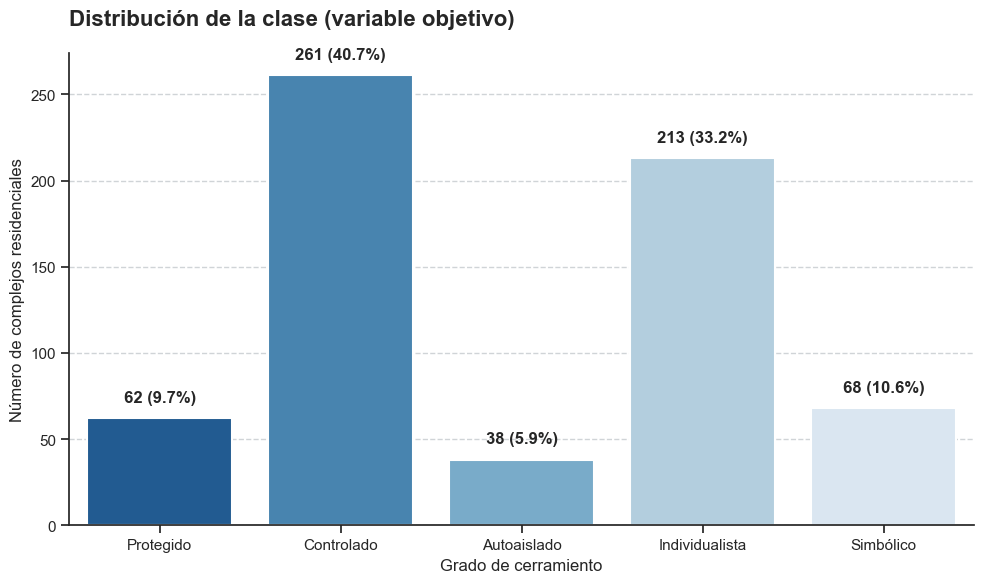

In [8]:
plot_univariate_distribution(df,"URB_label", title="Distribución de la clase (variable objetivo)", axis_label= "Grado de cerramiento", order=orden_urb_label)

El problema de clasificación asociado a esta base de datos presenta un desbalanceo moderado entre clases. Las etiquetas predominantes son *Controlado* e *Individualista*, que representan el $40.65\%$ y el $33.18\%$ de los complejos residenciales, respectivamente.

Las tres etiquetas restantes presentan una frecuencia notablemente inferior. Mientras que *Protegido* y *Simbólico* muestran proporciones similares, cercanas al $10\%$, la clase *Autoaislado* representa únicamente el $5.92\%$ de los registros.

Por tanto, el *accuracy* no resulta suficiente como métrica única para evaluar el rendimiento del modelo, ya que podría verse influido por el predominio de las clases mayoritarias. Será necesario complementar su análisis mediante métricas más robustas frente al desbalanceo, como el *F1-score macro*, que permite evaluar de forma equilibrada la *precision* y el *recall* en todas las clases. En el *notebook 03_Performance.ipynb* se definen las métricas empleadas para evaluar el rendimiento de los modelos de clasificación sobre este conjunto de datos.

<a id="variable_descriptivas_eda"></a>
# 3. Análisis de las variables descriptivas

Aunque las variables informativas o descriptivas, descritas en la sección [1.1.2 Variables informativas o descriptivas](#variables_informativas_descripcion), no se utilizaron en la clasificación de referencia, su análisis permite obtener una mejor comprensión del conjunto de datos. Además, algunas de estas variables serán empleadas posteriormente con distintos propósitos a lo largo de este trabajo.

En las siguientes subsecciones se estudian los diferentes bloques temáticos de variables informativas.

<a id="informacion_general"></a>
## 3.1 Información general

Este bloque agrupa variables que contienen información sobre diferentes identificadores del Catastro e información geográfica. A continuación se analizan aquellas variables de interés para los objetivos de este trabajo.

<a id="identificador_unico"></a>
### 3.1.1 Identificador único de complejos residenciales

La base de datos contiene varios identificadores asociados a los complejos residenciales. Sin embargo, únicamente la variable **CC**, correspondiente al código completo del complejo residencial, actúa como identificador único para cada registro.

Por este motivo, la variable **CC** se utilizará para identificar de forma inequívoca cada complejo residencial. Asimismo, permitirá vincular los resultados obtenidos con la información disponible en la base de datos original cuando sea necesario.

A continuación se comprueba que la variable **CC** presenta un valor único para cada registro de la base de datos.

In [9]:
# Convert CC column to int
df["CC"] = df["CC"].astype(int)

# Check unique values
es_unico = df["CC"].is_unique

if es_unico:
    print("La variable CC es un identificador único en la base de datos.")
else:
    print("Existen valores duplicados en la variable CC, no puede utilizarse como identificador único")

La variable CC es un identificador único en la base de datos.


<a id="distribucion_municipio"></a>
### 3.1.2 Distribución de los complejos residenciales por Municipio

La variable **MUN** contiene el municipio del área metropolitana de Granada al que pertenece el complejo residencial. En el gráfico de barras, que se muestra a continuación, se presentan todos los municipios presentes en la base de datos así como el número de complejos residenciales que albergan. 

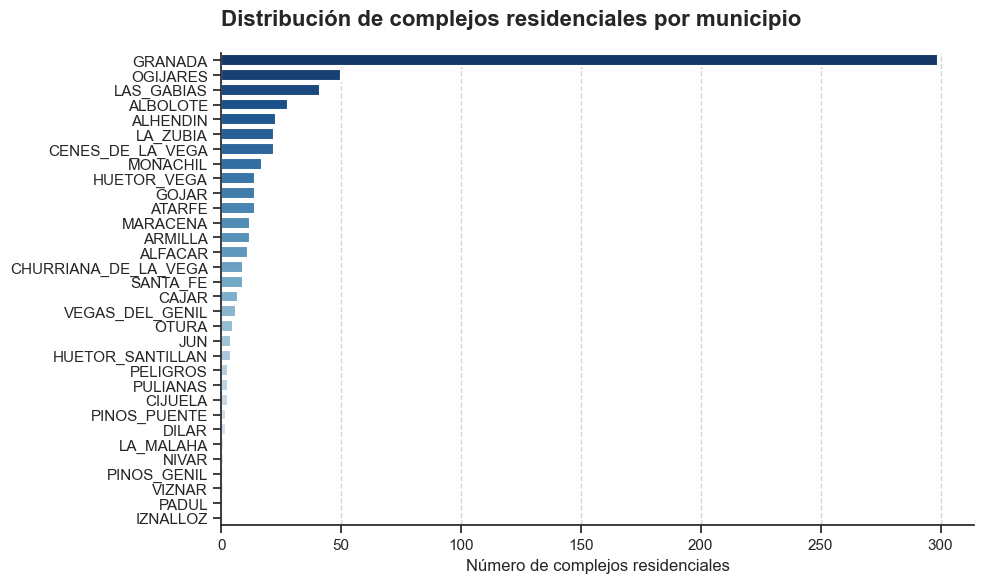

In [10]:
plot_univariate_distribution(df,"MUN", title="Distribución de complejos residenciales por municipio",
                              axis_label= "", show_values= False, orientation="horizontal", figsize=(10,6))

En la base de datos estan representados $32$ municipios del área metropolitana de Granada. Aproximadamente la mitad de los complejos residenciales pertenecen a la ciudad de Granada.

Esta distribución geográfica permitirá analizar como se distribuyen las diferentes tipologías de cerramiento desde el casco histórico de la ciudad hasta los municipios periféricos del área metropolitana, lo que aporta información relevante para el estudio urbanístico desarrollado por los investigadores.

<a id="cartografia"></a>
### 3.1.3 Cartografía

La representación cartográfica constituye una herramienta útil para explorar la distribución espacial de los complejos residenciales incluidos en la base de datos. Para ello, cada complejo se ubica sobre un mapa a partir de sus coordenadas de latitud y longitud (variables **LAT** y **LON**).

Con este objetivo, se ha desarrollado la función *plot_fix_map()* en el módulo *src.EDA_utils.py*. Esta función genera un mapa estático en el que se representan todos los complejos residenciales contenidos en un dataframe de entrada. Cada complejo se muestra mediante un icono que representa su grado de cerramiento.

A continuación se ubican sobre el mapa, todos los complejos residenciales de la base de datos:

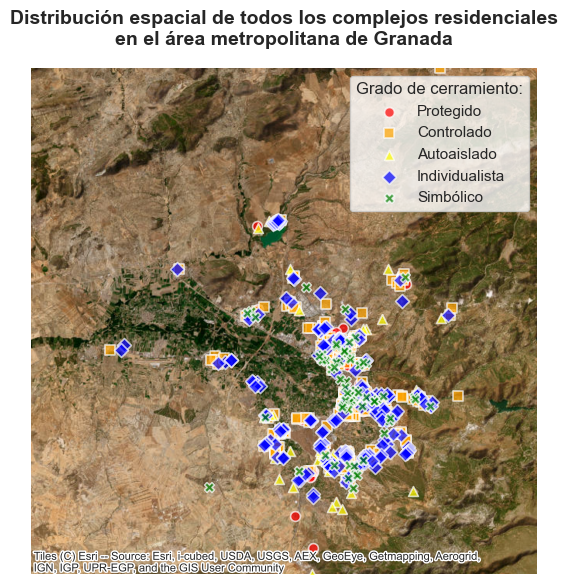

In [11]:
plot_fix_map(df, "Distribución espacial de todos los complejos residenciales\nen el área metropolitana de Granada", figsize=(6, 6))

Lo más interesante es visualizar los complejos residenciales de forma individual, esto permite analizar en mayor detalle su morfología urbanística. A continuación se muestra un complejo residencial de cada tipología de cerramiento.

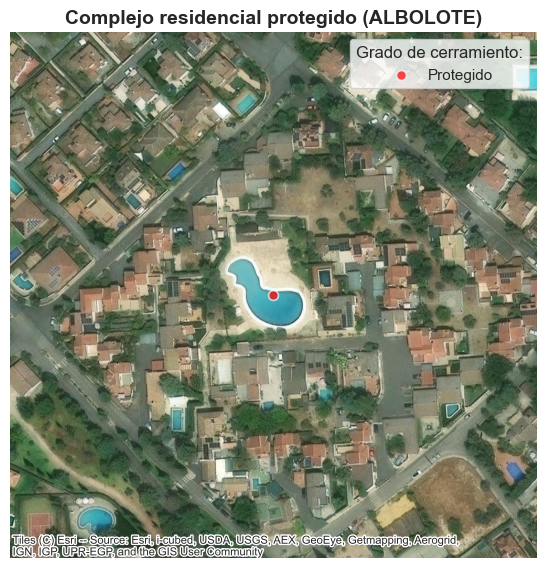

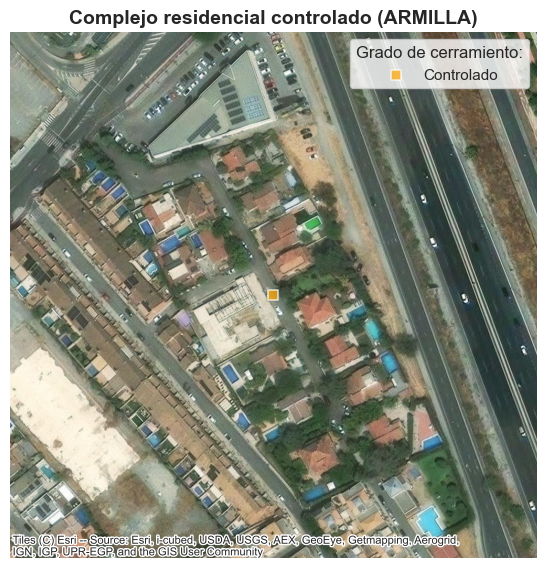

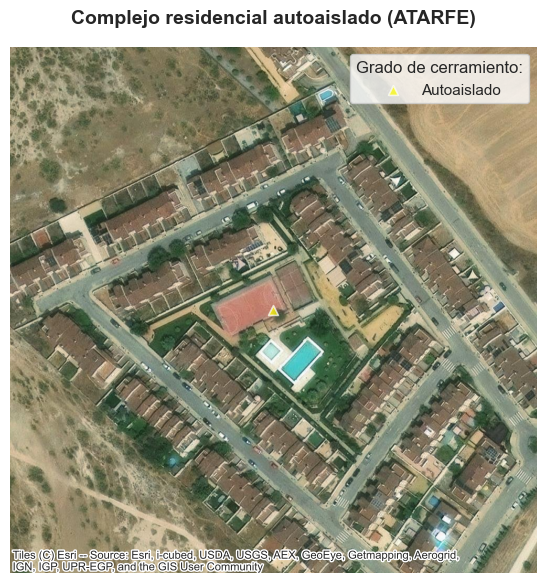

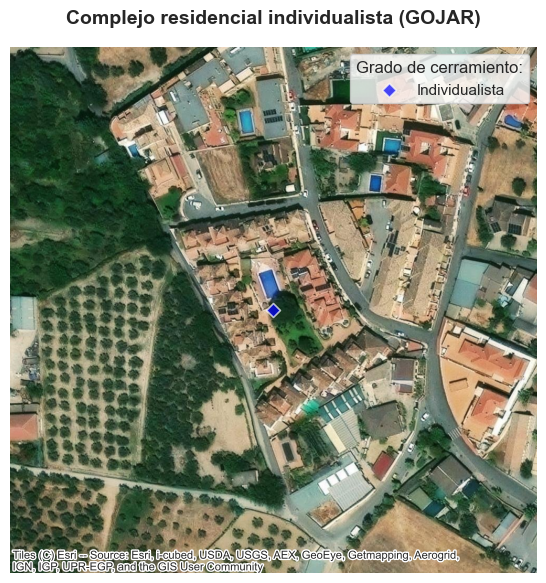

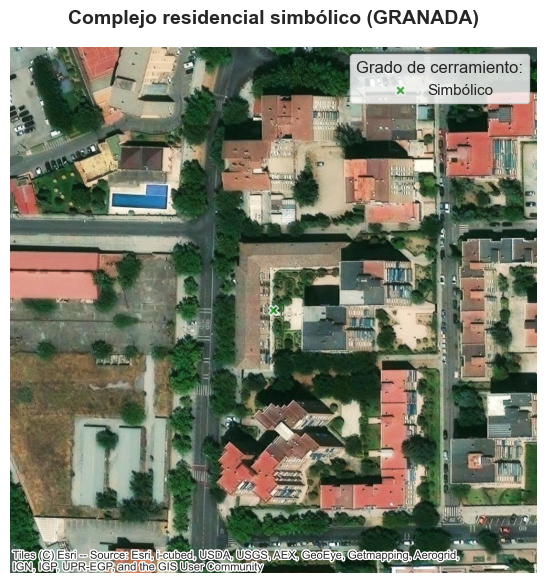

In [12]:
plot_fix_map(df[df["CC"]==301014], "Complejo residencial protegido (ALBOLOTE)", figsize=(6,6))
plot_fix_map(df[df["CC"]==2101006], "Complejo residencial controlado (ARMILLA)", figsize=(6,6))
plot_fix_map(df[df["CC"]==2201001], "Complejo residencial autoaislado (ATARFE)", figsize=(6,6))
plot_fix_map(df[df["CC"]==8401018], "Complejo residencial individualista (GOJAR)", figsize=(6,6))
plot_fix_map(df[df["CC"]==8703024], "Complejo residencial simbólico (GRANADA)", figsize=(6,6))

<a id="caracteristicas_basicas"></a>
## 3.2 Características básicas

Las variables de este bloque aportan información básica sobre el complejo residencial como el año de construcción, área ocupada y número de viviendas. 

Aunque estas variables son descriptivas y no se utilizarán para entrenar los modelos de clasificación, su análisis exploratorio es relevante para comprender en mayor profundidad el contexto de la base de datos y estudiar posibles patrones respecto a la clasificación de referencia.

<a id="year"></a>
### 3.2.1 Año de construcción

La base de datos incluye tres variables relacionadas con el periodo de construcción de los complejos residenciales: **AÑO**, **AñoPri** y **AñoFin**. Estas variables proporcionan información complementaria, ya que **AÑO** recoge el intervalo comprendido entre el año de inicio de la construcción (**AñoPri**) y el año de finalización (**AñoFin**).

Se utilizará la variable **AñoFin**, puesto que refleja el momento en el que quedó completada la última vivienda del complejo residencial y, por tanto, representa de forma más adecuada la fecha de consolidación del desarrollo urbanístico. Además, en la variable **AñoPri** existen $570$ valores faltantes debido a que dichos complejos residenciales se construyeron durante un único año.

A continuación se muestra la distribución del año de finalización de la construcción para cada grado de cerramiento definido en la clasificación de referencia.

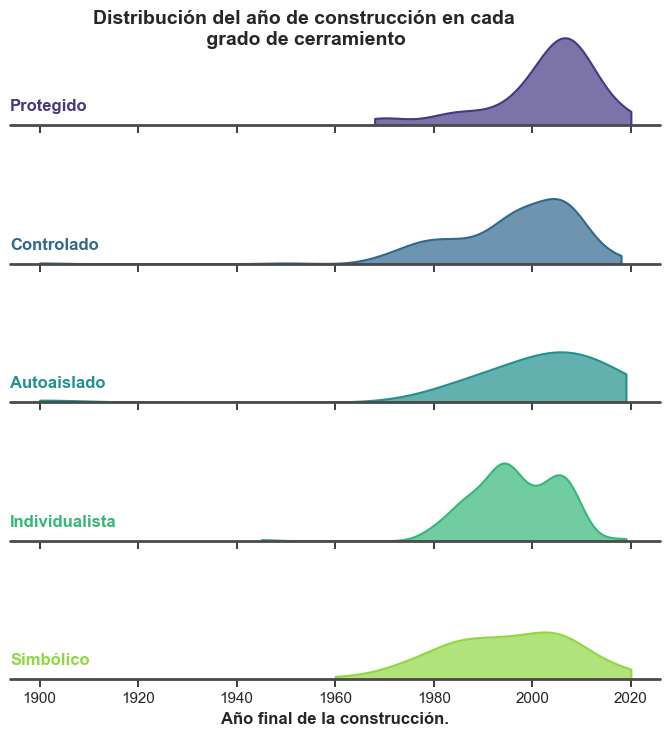

In [13]:
# Una cuadricula para cada etiqueta de la clase
g = sns.FacetGrid(
    df, row="URB_label", hue="URB_label", aspect=5, height=1.5, palette="viridis"
)
year_min = df["AñoFin"].min()
year_max = df["AñoFin"].max()

# Distribución de densidad del año de construccion
g.map(
    sns.kdeplot, "AñoFin", fill=True, alpha=0.7, linewidth=1.5, cut=0, clip=(year_min, year_max)
)

# Linea base para cada grafico
g.map(plt.axhline, y=0, lw=2, clip_on=False, color="#4a4a4a")

# Función interna para poner el nombre de la etiqueta dentro de cada gráfico
def label(x, color, label):
    ax = plt.gca()
    ax.text(
        0,
        0.2,
        label,
        fontweight="bold",
        color=color,
        ha="left",
        va="center",
        transform=ax.transAxes,
        fontsize=12,
    )


g.map(label, "AñoFin")
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

plt.xlabel("Año final de la construcción.", fontsize=12, weight="bold")
g.fig.suptitle(
    "Distribución del año de construcción en cada\n grado de cerramiento",
    fontsize=14,
    weight="bold",
)
plt.show()

El gráfico muestra que no existe una relación entre el grado de cerramiento y el año de construcción de los complejos residenciales. En general, todas las tipologías presentan distribuciones similares, extendiéndose de forma relativamente homogénea entre 1960 y 2020.

No obstante, la categoría Protegido, correspondiente al mayor grado de cerramiento, presenta una mayor concentración de complejos construidos a partir del año $2000$. Una posible explicación es la adopción relativamente reciente en Europa de este modelo urbanístico, tradicionalmente más extendido en Estados Unidos, cuya proliferación coincidió con el ciclo expansivo del mercado inmobiliario durante la década de los $2000$.

<a id="superficie"></a>
### 3.2.2 Superficie ocupada por el complejo residencial

La variable **SUP** indica el área que ocupa el complejo residencial en $m^2$. A continuación, se muestra la distribución de esta variable en función del grado de cerramiento usando un diagrama de cajas.

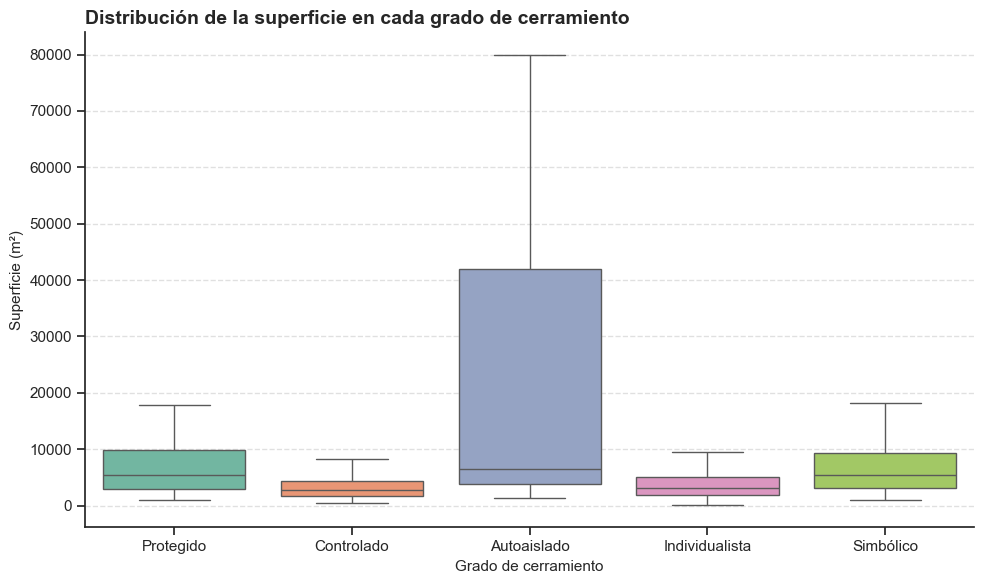

In [14]:
plot_boxplot(df, "URB_label", "SUP", title="Distribución de la superficie en cada grado de cerramiento", xlabel="Grado de cerramiento", ylabel="Superficie (m²)")

El gráfico de cajas omite los valores atípicos (*outliers*) para favorecer la legibilidad de la visualización. No se observan diferencias significativas entre las medianas de los grupos; la única categoría que se destaca es 'Autoaislado', la cual presenta una variabilidad muy alta con superficies de hasta $80000\text{ m}^2$. Este comportamiento puede responder a las características urbanísticas de dichos complejos, habitualmente situados en zonas periféricas. A pesar de esto, existen outliers en todas las categorías con magnitudes notablemente altas.

En este sentido, se verifica que esta variable actúa únicamente como un rasgo morfológico contextual que carece de relevancia semántica respecto al grado de cerramiento.

<a id="nviv"></a>
### 3.2.3 Número de viviendas

La variable **NVIV** indica el número de viviendas que tiene el complejo residencial. A continuación, se muestra la distribución de esta variable en función del grado de cerramiento usando un diagrama de cajas.

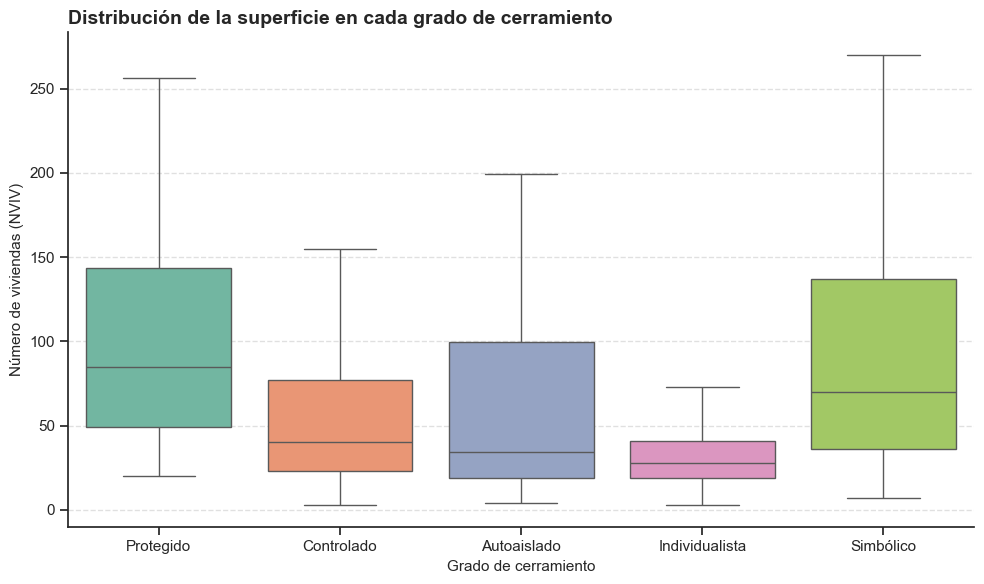

In [15]:
plot_boxplot(df, "URB_label", "NVIV", title="Distribución de la superficie en cada grado de cerramiento", xlabel="Grado de cerramiento", ylabel="Número de viviendas (NVIV)")

El diagrama de cajas del número de viviendas no muestra diferencias apreciables entre los distintos grados de cerramiento. En general, esta variable presenta distribuciones similares en todas las categorías, sin evidencias de una relación clara con la tipología de cerramiento.

Aunque las categorías Protegido, Simbólico y Autoaislado presentan una mayor dispersión de los datos, sus valores centrales son comparables al resto de grupos, como reflejan sus medianas.

En efecto, el número de viviendas se comporta como una variable descriptiva, sin capacidad discriminativa para diferenciar entre los distintos grados de cerramiento.

<a id="tipo_de_residencia"></a>
## 3.3 Tipos de residencia y equipamientos comunes

Las variables incluidas en los bloques "Tipo de residencia" y "Equipamientos comunes" contienen información descriptiva sobre la presencia/ausencia de diferentes elementos en los complejos residenciales. En particular, el bloque "Tipo de residencia" recoge información relativa al tipo de viviendas presentes en cada complejo (unifamiliares pareadas, unifamiliares adosadas, pisos, etc), mientras que los "Equipamientos comunes" describen la existencia de espacios compartidos, como piscinas o jardines, que son condición necesaria para catalogar un desarrollo urbanístico como complejo residencial.

Estas variables no han sido consideradas por los investigadores para realizar la clasificación de referencia, ya que su significado semántico no guarda una relación directa con la tipología de grado de cerramiento. Aunque estas variables pudieran presentar una asociación significativa con la variable objetivo y, por tanto, aportar información útil que mejorara el rendimiento predictivo de los modelos de clasificación, la interpretación de dicha contribución no resultaría valiosa en términos urbanísticos.

La base de datos y la clasificación de referencia desarrollada por los investigadores, pretende servir como una metodología homogénea y potencialmente extensible a otras ciudades europeas. La inclusión de variables cuya relación con el grado de cerramiento no esté sustentada por criterios urbanísticos podría inducir al modelo a aprender correlaciones espurias dependientes del contexto geográfico analizado. Por ejemplo, si una proporción elevada de los complejos clasificados como "Simbólicos" dispusiera de piscina, el modelo podría asociar erróneamente la presencia de este equipamiento con dicha tipología. Sin embargo, en términos de las tipologías del grado de cerramiento, esta relación carecería de una justificación causal clara y podría explicarse simplemente por la elevada presencia de piscinas en el área metropolitana de Granada. En consecuencia, una asociación de este tipo podría no reproducirse en otras ciudades, limitando la capacidad de generalización del modelo y su contribución a la investigación.

Una situación análoga se presenta en las variables relacionadas con el tipo de vivienda. La presencia de determinados tipos de viviendas puede estar altamente condicionada por el modelo de desarrollo urbanístico local y, por tanto, reflejar características específicas del territorio estudiado en lugar de una relación intrínseca con el grado de cerramiento de los complejos residenciales. Es decir, no tiene sentido conceptual obtener un modelo que relacione el grado de cerramiento con viviendas unifamiliares o con pisos.

No obstante, con el fin de complementar el análisis exploratorio desarrollado en este trabajo, se ha investigado la posible existencia de asociaciones entre estas variables y la variable objetivo. Este análisis tiene como finalidad aportar información adicional a los investigadores y evaluar si alguna de estas variables podría resultar de interés en futuras iteraciones del estudio o en investigaciones posteriores.

Dado que las variables analizadas son de naturaleza categórica binaria, su estudio requiere la aplicación de las mismas herramientas de análisis exploratorio presentadas en la siguiente sección (ver [4. Análisis exploratorio de las variables independientes (predictoras)](#variable_predictoras_eda)). Por motivos de claridad y para facilitar el seguimiento del presente *notebook*, este análisis se ha incluido en el [Anexo A: Análisis exploratorio de las variables informativas: Tipo de residencia y equipamientos comunes](#anexo_A), donde el lector ya dispone del conocimiento necesario sobre las metodologías empleadas y puede interpretar los resultados con mayor profundidad.

<a id="variable_predictoras_eda"></a>
# 4. Análisis exploratorio de las variables independientes (predictoras)

En esta sección se realiza un análisis exploratorio de todas las variables independientes (predictoras) que fueron utilizadas por los investigadores para realizar la clasificación de referencia. Estas seran las variables que se emplearan para entrenar y evaluar los modelos de clasificación. Dado que las variables estan agrupadas en bloques temáticos, el análisis exploratorio se realizará en subsecciones asociadas a cada bloque temático. 

A continuación se explica la metodología que se emplea para cada bloque.

**Análisis univariante**

Las variables independientes de la base de datos son de tipo categórico binario, tomando valores (0) o (1), con la excepción de la variable **DIS**, que presenta tres categorías. En las variables binarias, el valor (1) indica la presencia de una determinada característica en el complejo residencial, mientras que el valor (0) indica su ausencia. Por ejemplo, la variable MUR toma el valor (MUR=1) cuando el complejo residencial dispone de muros y (MUR=0) en caso contrario

Dada la naturaleza categórica de estas variables, el análisis univariante se basa en el estudio de sus frecuencias absolutas y relativas. Este análisis permite identificar las características más frecuentes y aquellas con una presencia minoritaria en el conjunto de datos. Las variables altamente desbalanceadas, es decir, las que aparecen mayoritariamente en los complejos residenciales (valor 1) o están ausentes de forma mayoritaria (valor 0), tienen una muy baja variabilidad que podría limitar su capacidad informativa en los modelos de clasificación. En este sentido, es importante identificar estas variables.

**Análisis bivariante: Estudio de la relación con la variable objetivo (dependiente)**

La variable dependiente, correspondiente a la tipología del grado de cerramiento, es de naturaleza categórica y presenta cinco niveles (ver sección [1.1.1 Variable dependiente: Clasificación de referencia](#variable_dependiente_descripcion)).

Dado que tanto la variable dependiente como las variables independientes son categóricas, el análisis bivariante se centra en el estudio de posibles asociaciones entre ellas. Es decir, se analiza cómo varía la distribución de la variable objetivo en función de los distintos valores de cada variable independiente. Este enfoque permite responder a cuestiones del tipo: ¿existen diferencias en la presencia de una determinada característica entre complejos residenciales con distinto grado de cerramiento?

La principal herramienta para analizar estas relaciones es la tabla de contingencia, que permite observar la distribución conjunta entre ambas variables. En este conjunto de datos, esta tabla nos permite observar como se distribuye la presencia o ausencia de la variable independiente dentro de cada uno de los níveles de la variable dependiente. Dado que los niveles de la variable dependiente están desbalanceados (ver sección [2. Análisis exploratorio de la variable dependiente](#variable_dependiente_eda)), se utiliza una tabla de contingencia porcentual aplicando una normalización por columnas. Esta normalización facilita la comparación entre categorías, ya que cada columna suma el $100\%$, permitiendo interpretar directamente el porcentaje de complejos residenciales que presentan o no una determinada característica dentro de cada grado de cerramiento.

Esta tabla es una herramienta para interpretar la existencia de asociaciones entre las variables. Sin embargo, para determinar con evidencia estadística está asociación,  se utiliza el test $\chi^2$ de Pearson.

El test $\chi^2$ de Pearson es un contraste estadístico utilizado para evaluar la existencia de asociación entre dos variables categóricas. Su objetivo es determinar si las diferencias observadas en la distribución conjunta de ambas variables son atribuibles al azar o si, por el contrario, existe evidencia suficiente para rechazar la hipótesis de independencia. En este sentido, la hipótesis nula ($H_0$) establece que ambas variables son independientes, es decir, que la distribución de una de ellas no depende de las categorías de la otra. La hipótesis alternativa ($H_1$) plantea que existe una relación de dependencia entre ambas variables.

El test se basa en la comparación entre las frecuencias observadas en la tabla de contingencia $O_{ij}$ y las frecuencias esperadas bajo el supuesto de independencia $E_{ij}$. Estas últimas se calculan a partir de los marginales como:
$$E_{ij}=\frac{(O_i)(O_j)}{n}$$
donde $O_{i\cdot}$ y $O_{\cdot j}$ representan las sumas marginales por fila y columna, y $n$ el tamaño muestral. A partir de estas cantidades se construye el estadístico del test:
$$\chi^2 = \sum_{i} \sum_{j} \frac{(O_{ij} - E_{ij})^2}{E_{ij}}$$
que mide la discrepancia global entre las frecuencias observadas y las esperadas bajo independencia. Valores elevados del estadístico indican una mayor desviación respecto al caso de independencia, lo que se traduce en un p-valor bajo y, por tanto, en evidencia estadística suficiente para rechazar $H_0$.

La información proporcionada por el test $\chi^2$ de Pearson se complementa con el coeficiente $V$ de Cramer, que permite cuantificar la intensidad de la asociación entre las variables. Este coeficiente se define a partir del estadístico $\chi^2$:
$$V = \sqrt{\frac{\chi^2}{n \cdot \min(r-1, c-1)}}$$
donde $r$ y $c$ son el número de filas y columnas de la tabla de contingencia. Este ajuste permite normalizar la medida en el intervalo $[0,1]$, donde valores próximos a 0 indican ausencia de asociación y valores cercanos a 1 reflejan una dependencia fuerte entre las variables.

Por tanto, el análisis de la relación entre las variables independientes y la variable dependiente se realiza utilizando estas tres herramientas de forma complementaria. El test $\chi^2$ de Pearson y el coeficiente de Cramer cuantifican numéricamente la evidencia estadística e intensidad de la asociación, mientras que la tabla de contingencia permite un análisis profundo para identificar qué categorías concretas de las variables están asociadas entre sí.

Para automatizar este procedimiento se ha desarrollado la función *cat_bivariate_analysis()* ubicada en el módulo *src.EDA_utils.py*. Esta función aplica el test $\chi^2$ de Pearson, calcula el coeficiente $V$ de Cramer y muestra los resultados en un cuadro de texto junto a la tabla de contingencia porcentual.

El objetivo de este análisis es evaluar la capacidad predictiva o discriminativa individual de cada variable independiente respecto a la variable objetivo. Esto proporciona una primera aproximación a la dificultad del problema y permite identificar relaciones potencialmente relevantes que servirán de apoyo durante la fase de interpretabilidad de los modelos.

No obstante, los resultados de este análisis no deben considerarse definitivos sobre la utilidad de las variables. La pertenencia de un complejo residencial a una determinada tipología de cerramiento puede estar determinada por patrones complejos que involucran la interacción de múltiples variables. Por tanto, una variable con escasa capacidad discriminativa de forma aislada puede resultar relevante cuando se combina con otras, dado que los modelos de aprendizaje automático pueden capturar estas dependencia multivariantes no observables de forma directa durante un análisis bivariante.

**Análisis bivariante: Estudio de la relación entre las variables independientes (predictoras)**

Tras analizar de manera individual la relación de cada variable independiente con la variable dependiente, se procede a estudiar las posibles correlaciones entre las propias variables indpendientes. Para ello, se utilizará el coeficiente de correlación $\phi$ cuyo fundamento matemático se presenta en la subsección final de este apartado (ver [4.7 Relación entre las variables independientes (predictoras)](#variable_predictoras_correlacion))

<a id="aspectos_estructurales"></a>
## 4.1 Aspectos estructurales

Las variables de este bloque aportan información sobre la estructura urbanística del complejo residencial. En particular indican la presencia o ausencia de diferentes tipos de calles y comercios.

<a id="tipos_de_calles"></a>
### 4.1.1 Tipos de calles

Las variables **CSS** (Calles sin salida), **CFS** (calles en fondo de saco) y **CPE** (Calles peatonales) caracterizan el tipo de calles presentes en el complejo residencial.

A nivel conceptual, la presencia de calles sin salida y calles en fondo de saco puede asociarse con grados de cerramiento más altos mientras que las calles peatonales pueden favorecer el tránsito de personas no residentes y por tanto disminuir la intensidad del cerramiento.

Para verificar estas asunciones se procede al análisis exploratorio de estas variables

In [16]:
# Convertir las variables a entero
calles_cols = ["CSS", "CFS", "CPE"]
df[calles_cols] = df[calles_cols].astype(int)
# Copia de dataframe para EDA de las variables de tipo de calle
df_calles = df[calles_cols+["URB_label"]].copy()

Dado que las calles sin salida y calles en fondo de saco son elementos estructurales diferentes pero que contribuyen de forma similar al aislamiento urbano, se estudia tanto la presencia individual de estos elementos como su aparición conjunta.

=== TABLA DE FRECUENCIAS INDIVIDUALES (Valor = 1) ===
    Variable Original  Frecuencia Absoluta (1)  Porcentaje del Total (%)
CSS               CSS                       68                     10.59
CFS               CFS                       35                      5.45


=== TABLA DE FRECUENCIAS: CSS vs CFS ===
          Frecuencia Absoluta  Porcentaje (%)
CSS_CFS                                      
Ninguno                   547           85.20
Solo CSS                   60            9.35
Solo CFS                   27            4.21
Ambos                       8            1.25
--------------------------------------------------


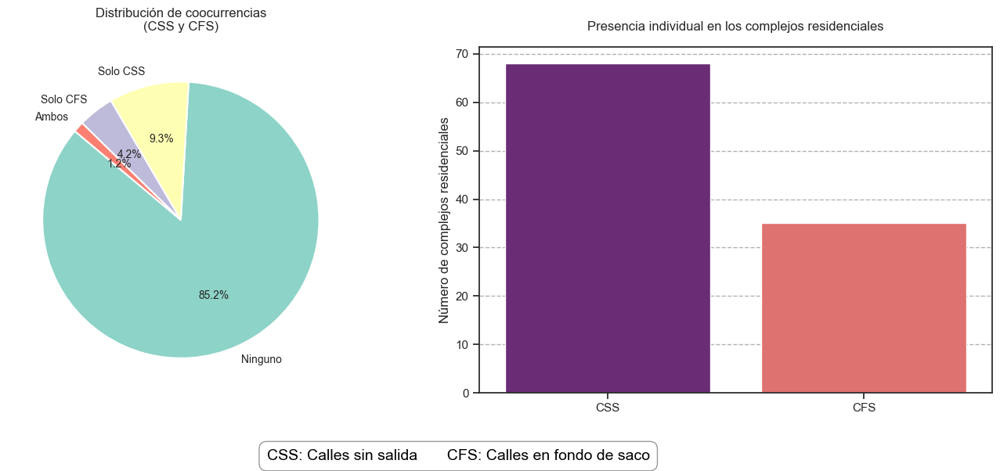

In [17]:
df_calles = analyze_binary_cooccurrence(df_calles, ["CSS", "CFS"], {"CSS":"Calles sin salida", "CFS":"Calles en fondo de saco"})

Los complejos residenciales que cuentan con al menos uno de estos elementos representan el $14.81\%$ de la base de datos. Tal y como se observa en la tabla de coocurrencias no es habitual que un complejo residencial cuente con ambos elementos de forma simultanea, tan solo el $1.25\%$ de los complejos residenciales presentan calles sin salida (**CSS**) y calles en fondo de saco (**CFS**).

La presencia de este tipo de calles no es habitual en los complejos residenciales del área metropolitana de Granada, siendo aproximadamente el doble de frecuentes las calles sin salida (**CSS**) frente a las calles en fondo de saco (**CFS**). A continuación se estudia, como se relacionan estas variables con el grado de cerramiento.

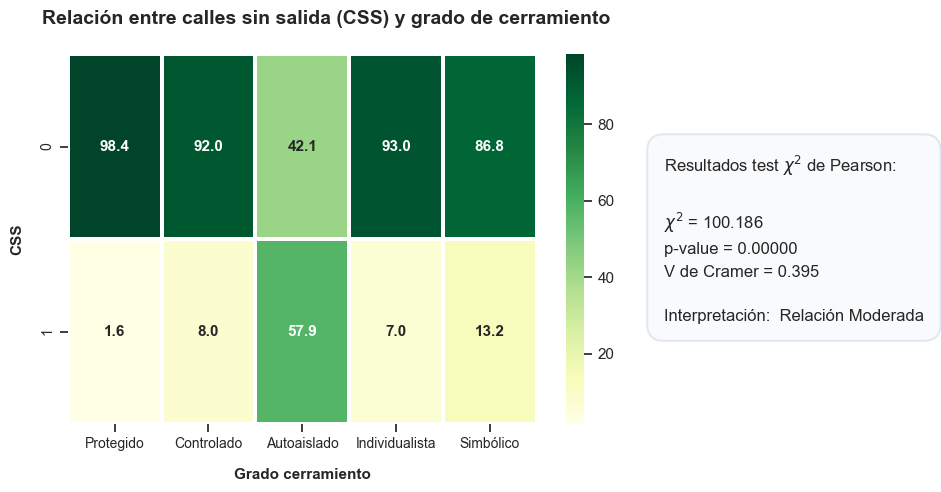

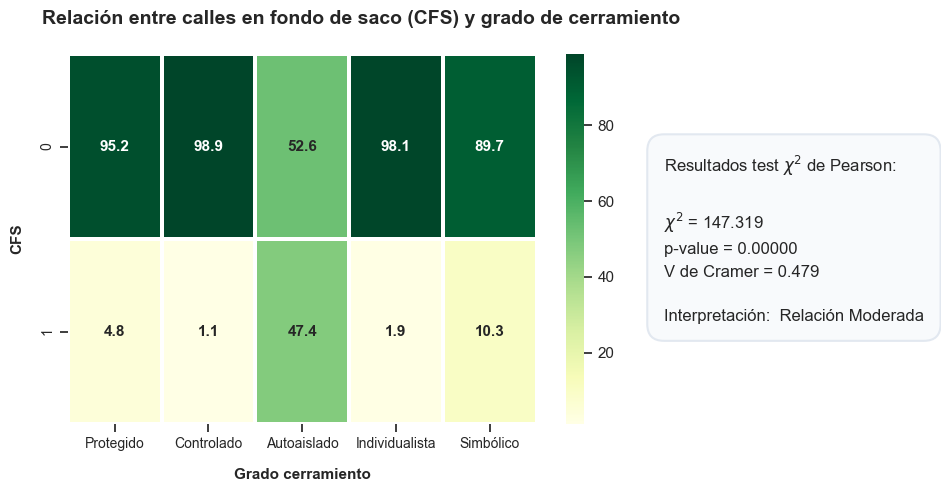

In [18]:
categorical_bivariate_analysis(df_calles, "URB_label", "CSS", "Relación entre calles sin salida (CSS) y grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_calles, "URB_label", "CFS", "Relación entre calles en fondo de saco (CFS) y grado de cerramiento", name_var_dep="Grado cerramiento")

El test $\chi^2$ de Pearson revela una asociación estadísticamente significativa entre las variables (p-value inferior a un grado de significancia $\alpha=0.05$), hecho que también puede observarse en las tablas de contingencia.

En ambos casos, la ausencia (valor 0) tanto de calles sin salida (**CSS**) como de calles en fondo de saco (**CFS**) predomina en todos los grados de cerramiento ($\approx90\%$), con excepción del nivel "Autoaislado". En esta categoría se observa un cambio notable en la distribución, lo que sugiere que la presencia de estas variables podría tener capacidad para diferenciar este grado de cerramiento del resto.

Este resultado se refuerza al analizar conjuntamente ambas variables (presencia individual de cada elemento, presencia simultánea de ambos o ausencia de ambos). Tal y como muestra la tabla de contingencia presentada a continuación, únicamente el $7.9\%$ de los registros clasificados con grado de cerramiento "Autoaislado" no presentan ni calles sin salida (**CSS**) ni calles en fondo de saco (**CFS**). Por el contrario, en el $92.1\%$ restante aparece al menos uno de estos elementos, lo que evidencia una fuerte asociación entre la presencia de estos elementos estructuralesy el grado de cerramiento "Autoaislado".

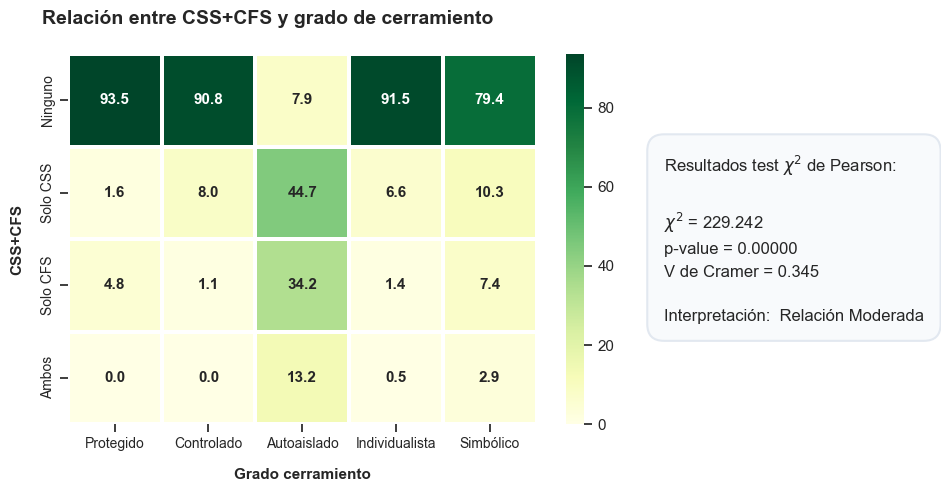

In [19]:
categorical_bivariate_analysis(df_calles, "URB_label", "CSS_CFS", "Relación entre CSS+CFS y grado de cerramiento", name_var_dep="Grado cerramiento", name_var_ind="CSS+CFS")

Puede concluirse que tanto **CSS** como **CFS** presentan el mismo comportamiento respecto a la variable objetivo. Será objeto de análisis, estudiar si ambas variables contribuyen de la misma forma a la interpretabilidad de los modelos.

La asociación de estas variables con el grado de cerramiento "Autoaislado" refuerza la hipótesis planteada a priori, ya que se vinculan preferentemente con una tipología de cerramiento caracterizada por su aislamiento respecto al resto del tejido urbano. Este resultado sugiere que la configuración y el uso de este tipo de calles podrían contribuir a intensificar dicho efecto de aislamiento.

A continuación se procede con un análisis similar para las calles peatonales (**CPE**).

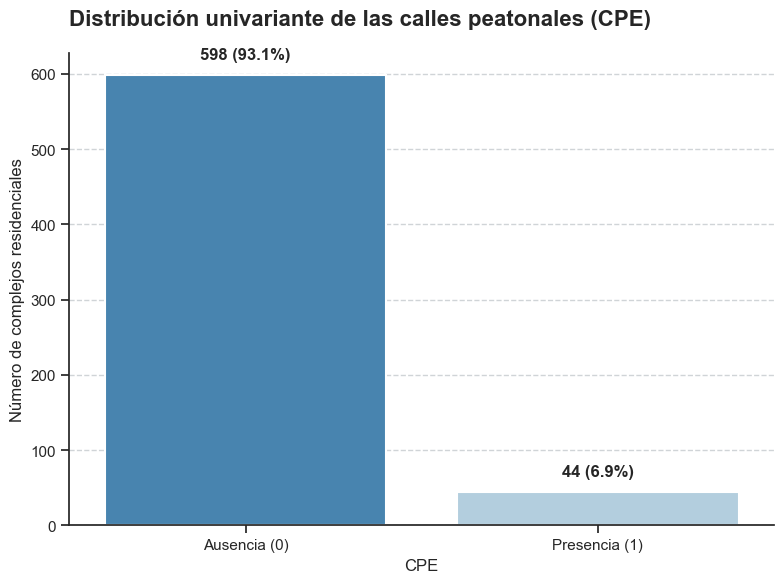

In [20]:
plot_univariate_distribution(df_calles, "CPE", title="Distribución univariante de las calles peatonales (CPE)",
                             dict_label={1: "Presencia (1)", 0: "Ausencia (0)"}, figsize=(8,6))

Se puede observar una clara predominancia de la ausencia de este elemento en los complejos residenciales. A continuación se analiza que relación tiene su presencia con el grado de cerramiento.

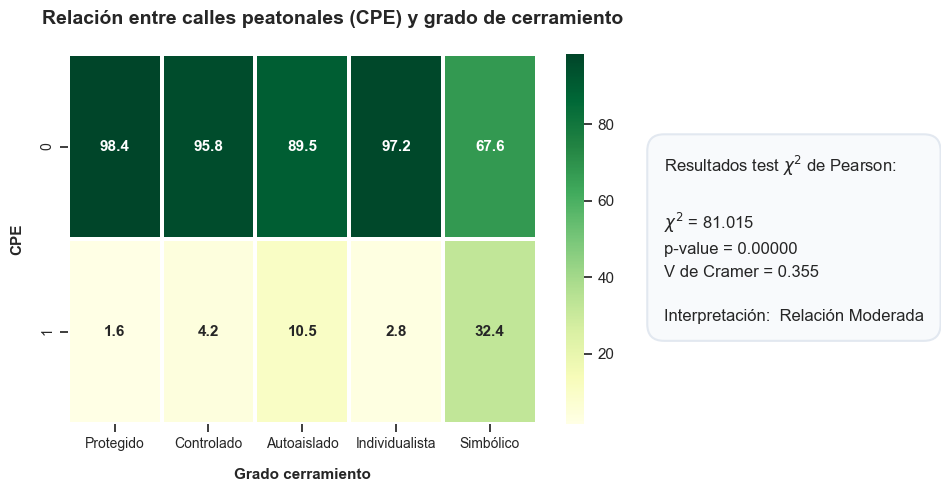

In [21]:
categorical_bivariate_analysis(df_calles, "URB_label", "CPE", "Relación entre calles peatonales (CPE) y grado de cerramiento", name_var_dep="Grado cerramiento")

La relación entre la variable **CPE** y el grado de cerramiento puede considerarse moderada, observándose una mayor presencia de calles peatonales en los complejos residenciales clasificados con un grado de cerramiento "Simbólico". Esto es coherente con la interpretación semántica de ambas variables, ya que la existencia de calles peatonales favorece la circulación y convivencia tanto de residentes como de no residentes, reduciendo así la intensidad del grado de cerramiento.

Por el contrario, la presencia de calles peatonales es muy reducida en las tipologías "Protegido", "Controlado" e "Individualista". No obstante, en la categoría "Autoaislado" se observa que un $10.5\%$ de los complejos residenciales dispone de este tipo de calles. Aunque este porcentaje es significativamente inferior al observado en la categoría "Simbólico", su magnitud no es despreciable y pone de manifiesto que en los complejos residenciales "autoaislados" no es raro que existan calles sin salida (**CSS**), calles en fondo de saco (**CFS**) y calles peatonales (**CPE**). 

Este hecho refleja la complejidad morfológica de los complejos residenciales y de su clasificación tipológica, ya que elementos urbanos cuya interpretación semántica podría asociarse a intensidades de cerramiento opuestas, pueden coexistir dentro de una misma categoría. Por tanto, las tipologías de cerramiento no deben entenderse como conjuntos homogéneos definidos por un único rasgo morfológico, sino como una clasificación en la que interactúan múltiples características con distintos niveles de influencia. 

<a id="tipos_de_comercios"></a>
### 4.1.2 Tipos de comercios

Las variables **LIN** (Comercios internos) y **LEX** (Comercios externos) indican la presencia o ausencia de estos elementos en el complejo residencial. La presencia de comercios en el complejo residencial tiene un impacto directo en la intensidad del cerramiento puesto que ambos implican, de algun modo, la presencia de clientes, que habitualmente no serán residentes del complejo residencial.

A continuación se analiza la distribución de estas variables de forma individual y de forma conjunta.

=== TABLA DE FRECUENCIAS INDIVIDUALES (Valor = 1) ===
    Variable Original  Frecuencia Absoluta (1)  Porcentaje del Total (%)
LIN               LIN                       28                      4.36
LEX               LEX                      177                     27.57


=== TABLA DE FRECUENCIAS: LIN vs LEX ===
          Frecuencia Absoluta  Porcentaje (%)
LIN_LEX                                      
Ninguno                   454           70.72
Solo LIN                   11            1.71
Solo LEX                  160           24.92
Ambos                      17            2.65
--------------------------------------------------


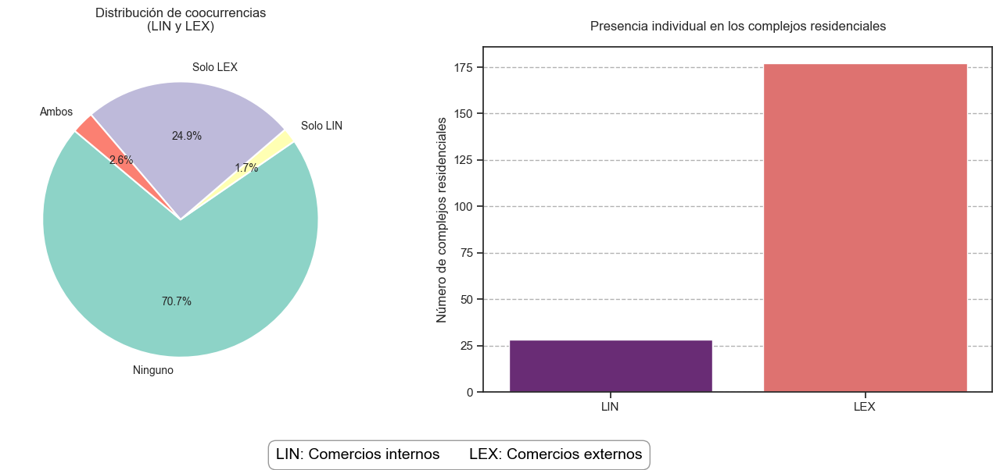

In [22]:
# Convertir las variables a entero
comercios_cols = ["LIN", "LEX"]
df[comercios_cols] = df[comercios_cols].astype(int)
# Copia de dataframe para EDA de las variables de tipo de comercio
df_comercios = df[comercios_cols+["URB_label"]].copy()
df_comercios = analyze_binary_cooccurrence(df_comercios, ["LIN", "LEX"], {"LIN":"Comercios internos", "LEX":"Comercios externos"})

Los complejos residenciales que cuentan con algún tipo de actividad comercial constituyen el $29.2\%$ de la base de datos. Entre ellos, predominan claramente los comercios localizados en el exterior del complejo residencial. Este comportamiento resulta consistente con la lógica funcional de estos establecimientos, ya que su ubicación en espacios más visibles y accesibles favorece la captación de clientes y el desarrollo de su actividad.

A continuación se analiza su relación con la variable objetivo mediante el test $\chi^2$ de Pearson y la tabla de contingencia.

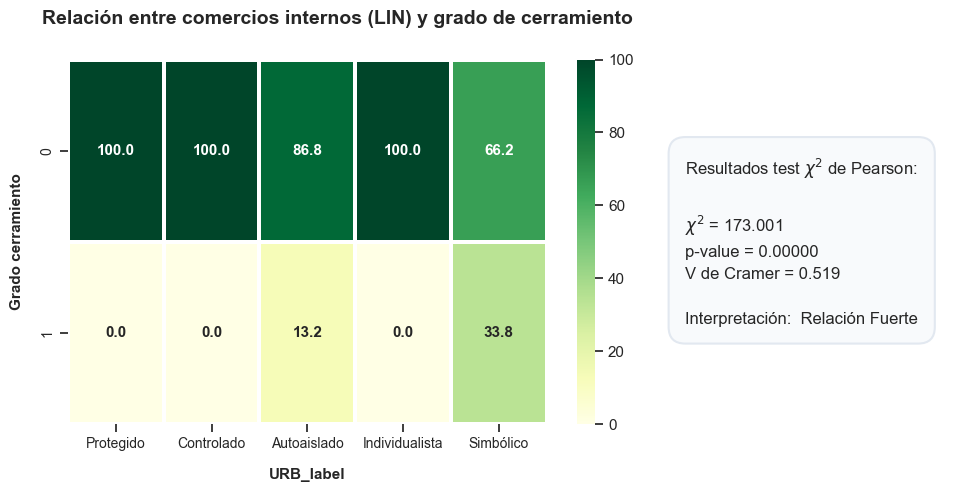

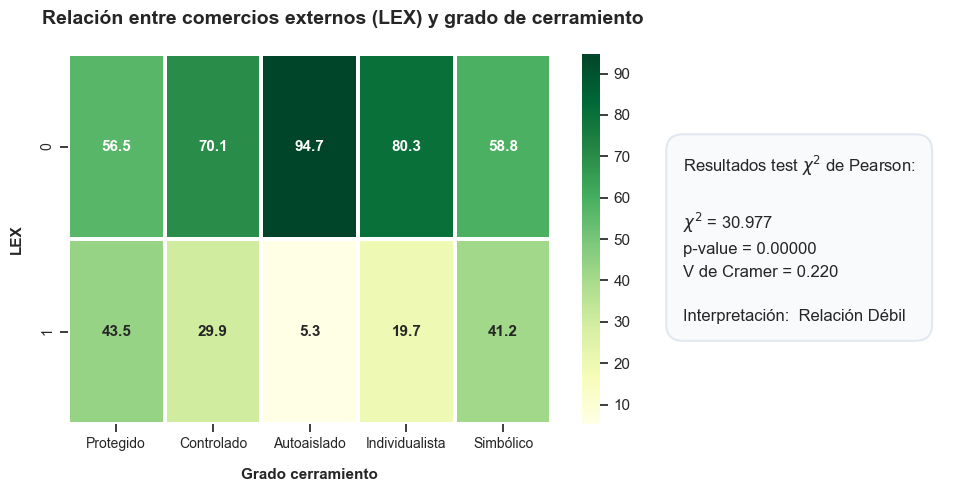

In [23]:
categorical_bivariate_analysis(df_comercios, "URB_label", "LIN", "Relación entre comercios internos (LIN) y grado de cerramiento", name_var_ind="Grado cerramiento")
categorical_bivariate_analysis(df_comercios, "URB_label", "LEX", "Relación entre comercios externos (LEX) y grado de cerramiento", name_var_dep="Grado cerramiento")

La relación entre las variables **LIN** (comercios internos) y **LEX** (comercios externos) con el grado de cerramiento, resulta estadísticamente significativa en ambos casos. Sin embargo, el patrón de asociación observado difiere notablemente entre ambas variables.

En el caso de los comercios internos (**LIN**), la variable presenta una clara capacidad discriminativa entre las distintas tipologías de cerramiento. Estos comercios están completamente ausentes en los complejos residenciales clasificados como "Protegidos", "Controlados" e "Individualistas", mientras que su presencia se concentra principalmente en las categorías "Simbólico" y, en menor medida, "Autoaislado".

La ausencia de comercios internos en los complejos "Protegidos" y "Controlados" resulta coherente con una mayor intensidad de cerramiento propia de estas tipologías, ya que las restricciones de acceso pueden limitar significativamente el flujo de potenciales clientes no residentes. Sin embargo, esta misma ausencia también se observa en los complejos "Individualistas", cuyo grado de cerramiento es más severo, caracterizado por un acceso individual a las viviendas. Este resultado  pone de manifiesto que una misma característica puede asociarse a tipologías con diferentes niveles de cerramiento, lo que refleja la complejidad inherente a la clasificación morfológica de los complejos residenciales.

Por el contrario, los comercios externos (**LEX**) muestran una menor capacidad discriminativa. Las distribuciones observadas en la tabla de contingencia son relativamente similares para tipologías con niveles de cerramiento opuestos, como las categorías "Protegido" y "Simbólico". Esto sugiere que la presencia de comercios externos no depende de forma tan directa del grado de cerramiento como ocurre con los comercios internos. La significación estadística detectada por el test $\chi^2$ de Pearson parece estar influida principalmente por el comportamiento de la categoría Autoaislado, donde el ($94.7\%$) de los complejos residenciales carecen de comercios externos. No obstante, fuera de esta tipología, la distribución de la variable resulta relativamente homogénea entre los distintos grados de cerramiento.

Puede concluirse que la capacidad discriminativa de la variable **LIN** (comercios internos) es mayor que la de la variable **LEX** (comercios externos). Desde una perspectiva urbanística, este comportamiento resulta consistente. Mientras que los comercios externos se localizan fuera del complejo residencial y, por tanto, su existencia depende en menor medida de las condiciones de acceso al complejo, los comercios internos están estrechamente vinculados a la accesibilidad al complejp residencial. En consecuencia, su presencia tiende a concentrarse en aquellas tipologías de cerramiento donde la interacción entre residentes y no residentes es más frecuente y viable.

<a id="distancia"></a>
## 4.2 Distancia al núcleo úrbano principal

Este bloque está compuesto unicamente por la variable **DIS** que indica la distancia del complejo residencial al núcleo úrbano principal más cercano. La variable puede tomar los siguientes $3$ valores categóricos:
* **1**: Urbanización aislada.
* **2**: Urbanización separada.
* **3**: Urbanización integrada en casco urbano.

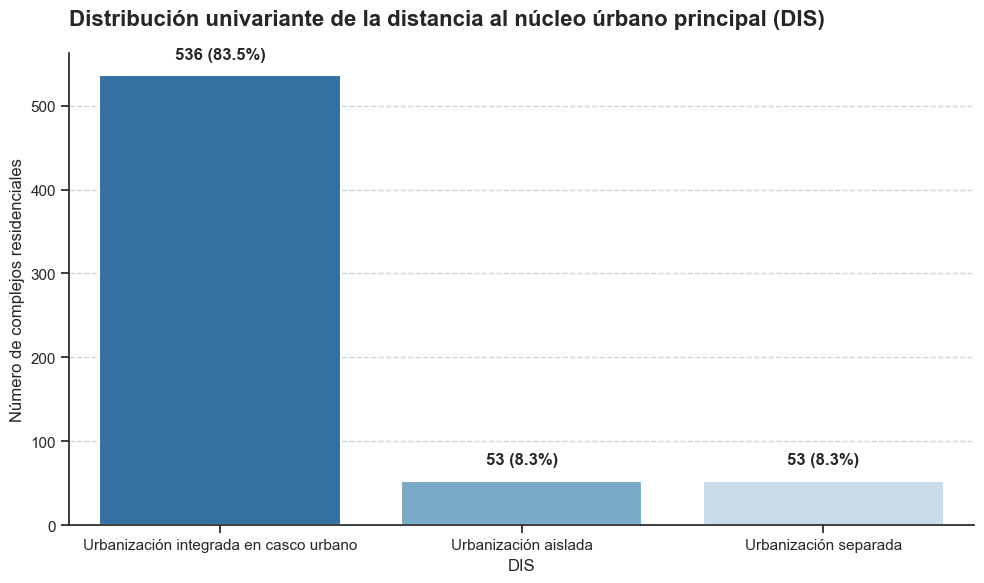

In [24]:
plot_univariate_distribution(df, "DIS", 
                            dict_label={1:"Urbanización aislada", 2: "Urbanización separada", 3: "Urbanización integrada en casco urbano"},
                            title="Distribución univariante de la distancia al núcleo úrbano principal (DIS)")

Como se puede observar existe un claro desequilibrio hacia los complejos residenciales integrados en el casco urbano. A continuación se analiza la relación de esta variable con el grado de cerramiento.

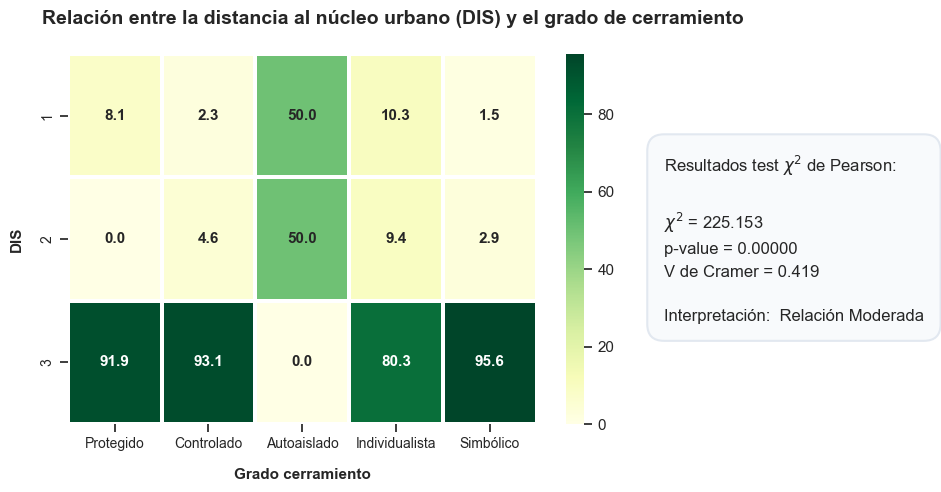

In [25]:
categorical_bivariate_analysis(df, "URB_label", "DIS", "Relación entre la distancia al núcleo urbano (DIS) y el grado de cerramiento", name_var_dep="Grado cerramiento")

El test $\chi^2$ de Pearson rechaza la hipótesis de independencia entre la variable **DIS** y el grado de cerramiento. Esta asociación se explica principalmente por el comportamiento de la categoría "Autoaislado", cuya distribución difiere notablemente del resto de tipologías.

No existen complejos residenciales "Autoaislados" con valor de distancia "Urbanización integrada en casco urbano (3)". Como consecuencia, los complejos "Autoaislados" quedan asociados a las categorías de distancia "Urbanización aislada (2)" y "Urbanización separada (1)". No obstante, ambas presentan una proporción del $50\%$, por lo que ninguna destaca como factor predominante dentro de esta tipología de cerramiento.

En términos urbanísticos, este resultado sugiere que el grado de cerramiento "Autoaislado" no se caracteriza unicamente por la presencia de elementos físicos en el complejo residencial, si no por una localización geográfica desvinculada del tejido urbano más cercano.

<a id="codificacion_distancia"></a>
### 4.2.1 Codificación de la variable DIS

La variable de distancia es de tipo categórico nominal. Aunque la categoría “Urbanización integrada en casco urbano” implica una menor distancia al núcleo urbano que “Urbanización aislada” y “Urbanización separada”, no es posible imponer una estructura ordinal coherente entre ellas. Asimismo, no resulta justificable asignar una relación de orden o distancia numérica entre “Urbanización aislada” y “Urbanización separada”, ya que ambas representan situaciones geográficas similares pero con significados conceptuales distintos.

Por este motivo, se aplica una codificación *dummy (one-hot encoding)*, que consiste en transformar la variable categórica original en un conjunto de variables binarias indicadoras, una por cada categoría existente en la variable **DIS**. De esta forma, cada nueva variable toma el valor (1) cuando el complejo residencial pertenece a la categoría representada y el valor (0) en caso contrario.

Sea **DIS** la variable categórica con tres posibles niveles: Urbanización aislada (1), Urbanización separada (2) y Urbanización integrada en casco urbano (3). La transformación genera las siguientes variables binarias:

* **DIS_1**: toma el valor (1) si (DIS=1) (Urbanización aislada) y (0) en cualquier otro caso.
* **DIS_2**: toma el valor (1) si (DIS=2) (Urbanización separada) y (0) en cualquier otro caso.
* **DIS_3**: toma el valor (1) si (DIS=3) (Urbanización integrada en casco urbano) y (0) en cualquier otro caso.

Como consecuencia, cada complejo residencial queda representado mediante un vector binario en el que únicamente una de las variables indicadoras puede tomar el valor (1), mientras que las restantes toman el valor (0). Por ejemplo, un complejo residencial con valor de distancia "Urbanización separada" se representaría mediante el vector: 

$$(DIS\_1, DIS\_2, DIS\_3) = (0,1,0)$$

In [26]:
# Creación de variables dummies a partir de variable DIS
dummies = pd.get_dummies(df["DIS"], prefix="DIS").astype(int)
df = pd.concat([df, dummies], axis=1)
print("Primeras cinco filas del dataframe (variable DIS y codificación One-Hot):")
print(df[["DIS","DIS_1","DIS_2","DIS_3"]].head())

Primeras cinco filas del dataframe (variable DIS y codificación One-Hot):
   DIS  DIS_1  DIS_2  DIS_3
0    1      1      0      0
1    1      1      0      0
2    1      1      0      0
3    1      1      0      0
4    1      1      0      0


<a id="tipo_cerramiento"></a>
## 4.3 Tipo de Cerramiento

Las variables incluidas en este bloque describen los elementos de cerramiento presentes en los complejos residenciales. Estos elementos pueden clasificarse urbanísticamente en dos categorías según la intensidad de la barrera física que generan.

Por un lado, los cerramientos "duros" corresponden a elementos que establecen una separación física clara entre el espacio residencial y el entorno exterior, dificultando o restringiendo el acceso. Dentro de esta categoría se incluyen los muros (**MUR**) y las verjas (**VER**).

Por otro lado, los cerramientos "blandos" delimitan el espacio residencial de forma menos restrictiva, ejerciendo principalmente una función disuasoria, simbólica o de control parcial del acceso. Entre ellos se encuentran las cadenas (**CAD**), los bolardos (**BOL**), los arbustos (**ARB**) y los carteles de propiedad privada (**CPP**).

Esta distinción resulta relevante para el análisis, ya que cada elemento de cerramiento puede contribuir de forma diferente al grado de cerramiento del complejo residencial.

A continuación se analiza la presencia de estos elementos en los complejos residenciales de la base de datos para identificar las mas frecuentes y los menos comunes.

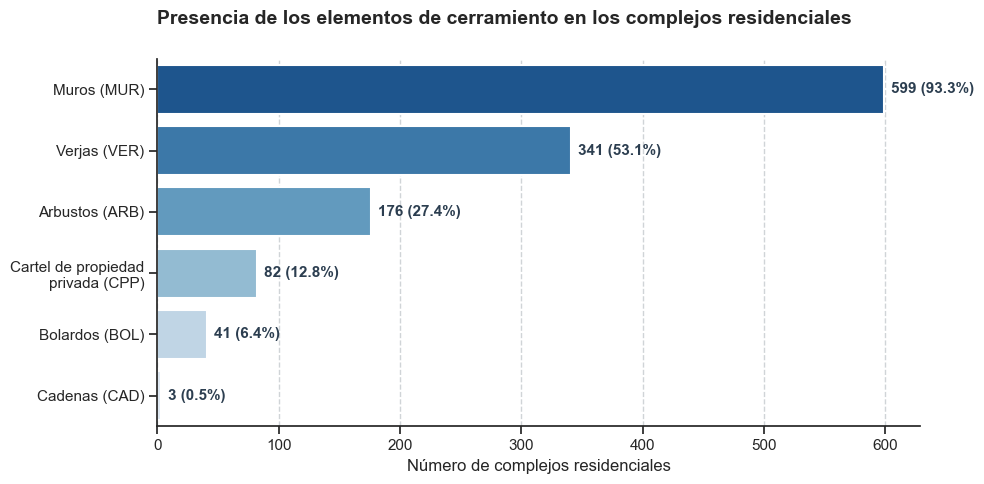

In [27]:
# Convertir las variables a entero
cerramiento_cols = ["VER", "MUR", "CAD", "BOL", "ARB", "CPP"]
df[cerramiento_cols] = df[cerramiento_cols].astype(int)
# Copia de dataframe para EDA de las variables de este bloque
df_cerramiento = df[cerramiento_cols+["URB_label"]].copy()
plot_variable_occurrences(df_cerramiento, cerramiento_cols, title="Presencia de los elementos de cerramiento en los complejos residenciales",
                               dict_label={
                                   "MUR": "Muros (MUR)",
                                   "VER": "Verjas (VER)",
                                   "ARB": "Arbustos (ARB)",
                                   "CPP": "Cartel de propiedad\nprivada (CPP)",
                                   "BOL": "Bolardos (BOL)",
                                   "CAD": "Cadenas (CAD)"
                               })

Es importante señalar que el porcentaje mostrado a la derecha de cada barra corresponde a la proporción de complejos residenciales, respecto al total, que presentan el elemento considerado. Dado que un mismo complejo puede contener varios de estos elementos, las categorías no son mutuamente excluyentes. En consecuencia, la suma de los porcentajes asociados a cada elemento no necesariamente alcanza el $100\%$.

Como se puede observar en el gráfico de barras, los muros (**MUR**) y las verjas (**VER**) son los elementos de cerramiento predominantes. Destacan los muros con una presencia en el $93.3\%$ de los complejos residenciales.

Los arbustos (**ARB**), carteles de propiedad privada (**CPP**) y bolardos (**BOL**) tienen una frecuencia de aparición considerablemente inferior pero con una variabilidad (entre presencia y ausencia) relevante. Sin embargo, la variable **CAD** está extremedamente desbalanceada con presencia en únicamente el $0.5\%$ de los complejos residenciales. En este sentido, esta variable podría ser excluida de los modelos de clasificación debido a su baja variabilidad. En el análisis de interpretabilidad e importancia de las variables se evaluará su impacto sobre las decisiones de los modelos.

A continuación se analiza la relación de estos elementos con el grado de cerramiento. En primer lugar, se analizan los cerramientos de tipo "duro".

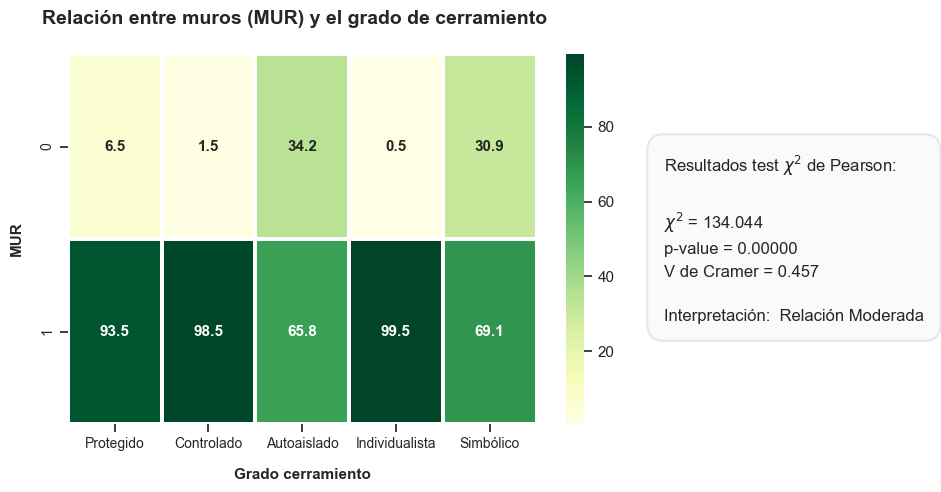

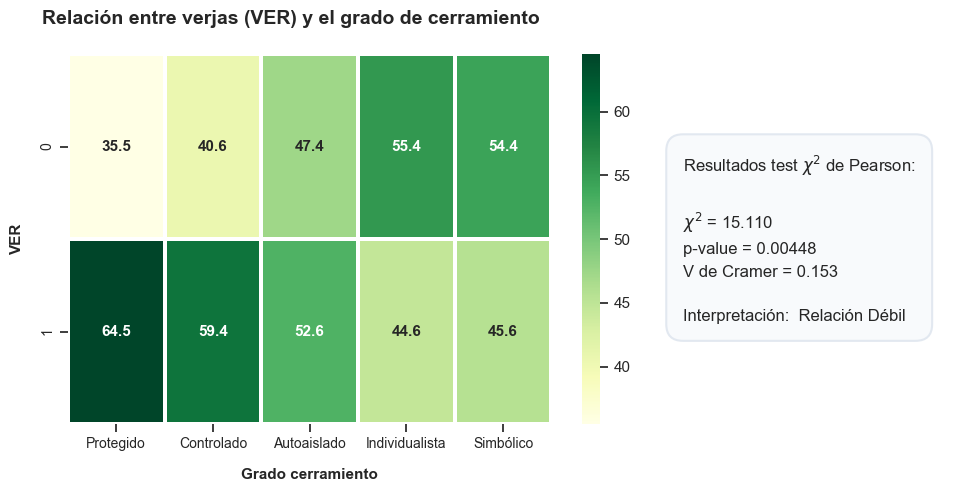

In [28]:
categorical_bivariate_analysis(df_cerramiento, "URB_label", "MUR", "Relación entre muros (MUR) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_cerramiento, "URB_label", "VER", "Relación entre verjas (VER) y el grado de cerramiento", name_var_dep="Grado cerramiento")

Los muros (**MUR**) constituyen el tipo de cerramiento más frecuente entre los complejos residenciales analizados. La tabla de contingencia muestra una elevada presencia de este elemento en todas las tipologías de cerramiento. Sin embargo, se observa una disminución relativa en los complejos "Autoaislados" y "Simbólicos", donde los muros están presentes en aproximadamente el $70\%$ de los casos, frente a porcentajes superiores al $90\%$ en las categorías "Protegido", "Controlado" e "Individualista".

Este comportamiento sugiere una asociación moderada entre la variable **MUR** y el grado de cerramiento, puesto que su ausencia tiende a relacionarse con dos grados de cerramiento. 

Por el contrario, la variable **VER** tiene una relación de asociación muy debil con el grado de cerramiento. Las proporciones de presencia y ausencia de verjas, se mantienen relativamente equilibradas en la mayoría de las categorías, situándose en torno al $\approx50\%$. Aunque el test $\chi^2$ de Pearson rechaza la hipótesis de independencia, esta significación estadística parece estar motivada principalmente por una ligera desviación en la categoría "Protegido", donde la presencia de verjas alcanza el $64.5\%$. Esta interpretación es consistente con el valor obtenido para el coeficiente V de Cramer, que cuantifica una asociación débil y, por tanto, una capacidad discriminativa limitada.

Estos resultados ponen de manifiesto que la relación entre los elementos de cerramiento físico y el grado de cerramiento es más compleja de lo que podría esperarse a priori. Aunque tanto los muros como las verjas pueden considerarse urbanísticamente como mecanismos de cerramiento duro, únicamente la ausencia de muros muestra una asociación apreciable con determinadas tipologías de cerramiento. En cambio, las verjas aparecen distribuidas de forma homogénea entre todas las categorías, lo que sugiere que su presencia, por sí sola, no constituye un indicador claro de una mayor intensidad de cerramiento

A continuación se analiza la tabla de contingencia y los resultados del test $\chi^2$ de Pearson para estudiar la relación de los tipos de cerramiento "blandos" y la variable objetivo. Debe tenerse en cuenta que la potencia estadística del test $\chi^2$, en el caso de la variable **CAD**, es muy reducida debido a su baja variabilidad. En este caso, el estudio de centra en el análisis de la tabla de contingencia.

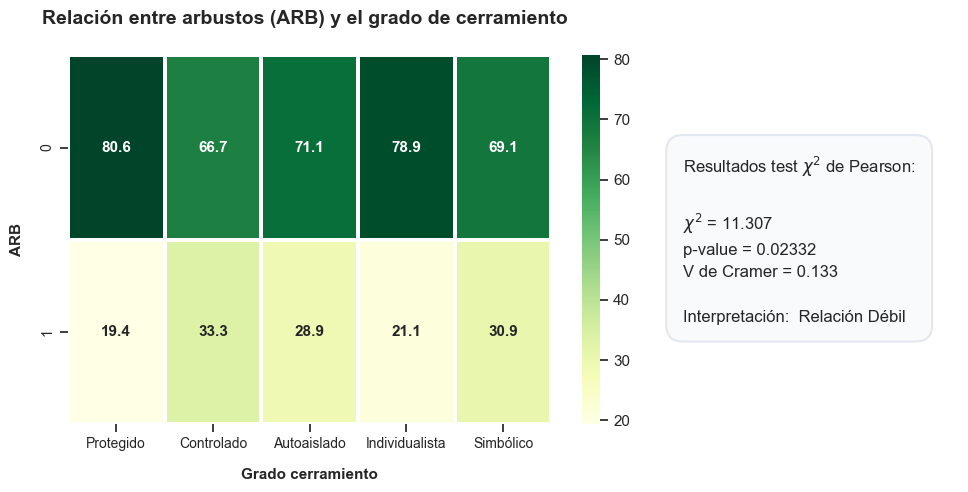

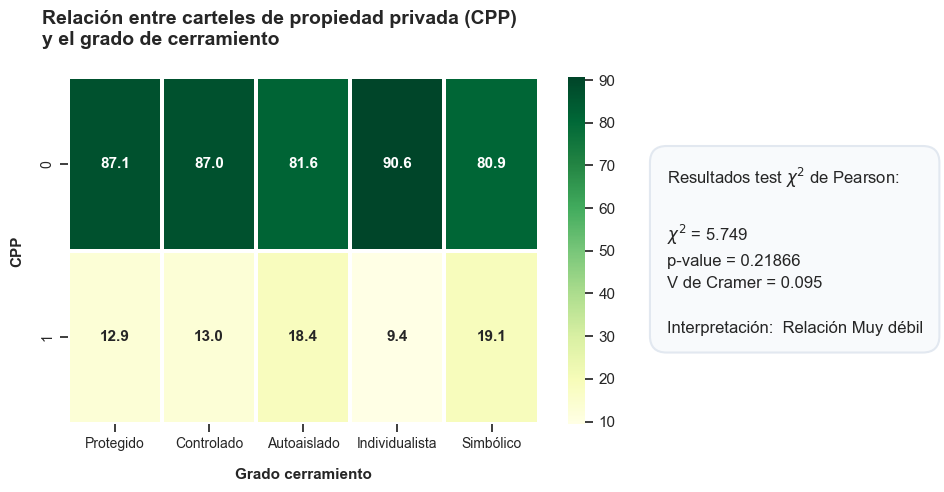

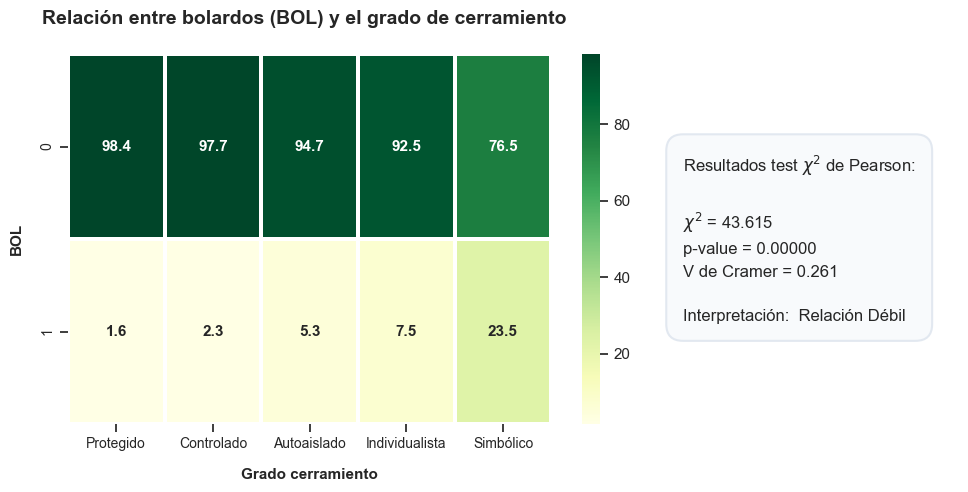

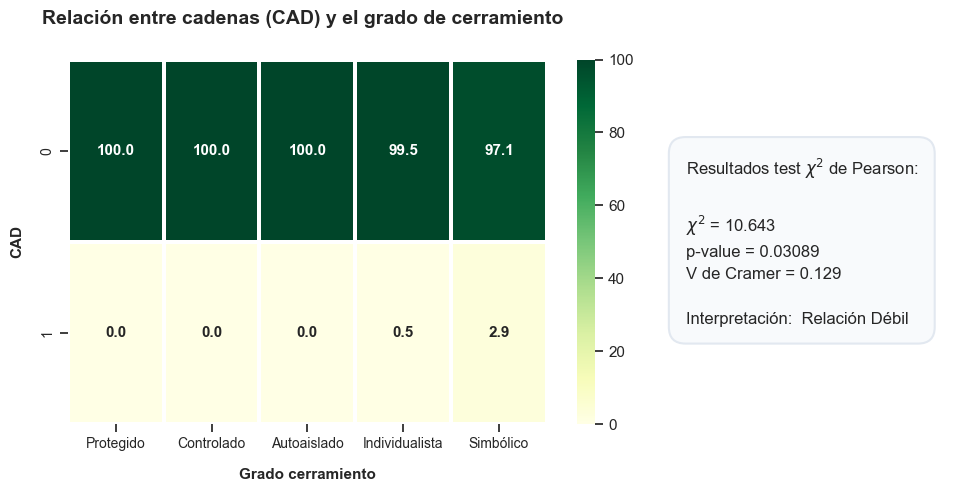

In [29]:
categorical_bivariate_analysis(df_cerramiento, "URB_label", "ARB", "Relación entre arbustos (ARB) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_cerramiento, "URB_label", "CPP", "Relación entre carteles de propiedad privada (CPP)\ny el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_cerramiento, "URB_label", "BOL", "Relación entre bolardos (BOL) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_cerramiento, "URB_label", "CAD", "Relación entre cadenas (CAD) y el grado de cerramiento", name_var_dep="Grado cerramiento")

El análisis de las tablas de contingencia y el resultado del test $\chi^2$ revela que la relación de asociación entre estas variables y el grado de cerramiento es muy débil puesto que ninguno de estos tipos de cerramiento se asocia de forma preferente a ninguna categoría del grado de cerramiento.

En el caso de los carteles de propiedad privada (**CPP**) el test no consigue rechazar la hipótesis de independencia para un grado de significancia $\alpha=0.05$, mientras que en arbustos (**ARB**) y cadenas (**CAD**) el $p-value$ es muy cercano a $\alpha$. El test $\chi^2$ de Pearson unicamente rechaza de forma clara en la asociación entre bolardos (**BOL**) y la variable dependiente. Aunque, el coeficiente $V$ de Cramer indica una relación débil. En la tabla de contingencia puede observarse una ligera asociación entre la presencia de bolardos y los complejos residenciales "Simbólicos". 

Se concluye de este análisis que la capacidad discriminativa individual de estas variables es muy limitada.

<a id="puntos_de_acceso"></a>
## 4.4 Puntos de acceso

Las variables de este bloque aportan información sobre la forma de acceder al complejo residencial. Este mecanismo es relevante para el grado de cerramiento, puesto que conceptualmente accesos comunes tienden a favorecer la interacción de los vecinos y por tanto diferir en un grado de cerramiento más bajo. Por el contrario, accesos individuales pueden favorecer grados de cerramiento más restricitivos.

Para verificar estas asunciones se estudia la relación de estas variables con el grado de cerramiento. En primer lugar se caracteriza su distribución individual mediante el número y porcentaje de complejos residenciales que tienen cada punto de acceso.

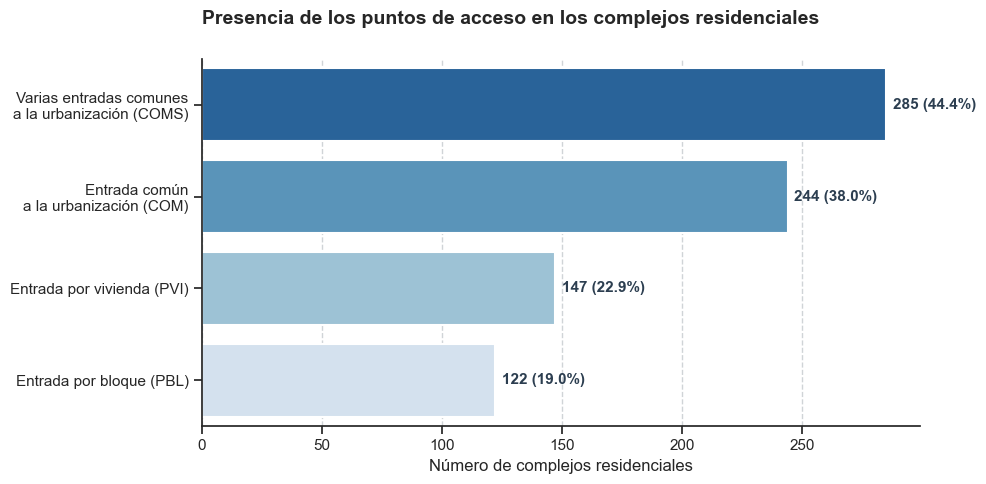

In [30]:
# Convertir las variables a entero
acceso_cols = ["PVI", "PBL", "COM", "COMS"]
df[acceso_cols] = df[acceso_cols].astype(int)
# Copia de dataframe para EDA de las variables de este bloque
df_acceso = df[acceso_cols+["URB_label"]].copy()
plot_variable_occurrences(df_acceso, acceso_cols, title="Presencia de los puntos de acceso en los complejos residenciales",
                               dict_label={
                                        "PVI": "Entrada por vivienda (PVI)",
                                        "PBL": "Entrada por bloque (PBL)",
                                        "COM": "Entrada común\na la urbanización (COM)",
                                        "COMS": "Varias entradas comunes\na la urbanización (COMS)"})

La presencia de los diferentes puntos de acceso en los complejos residenciales es relativamente equilibrada. Existe una predominancia de las entradas comunes (**COM** y **COMS**) frente a las entradas por vivienda (**PVI**) o bloque (**PBL**)

En primer lugar se analiza la relación de la entrada por vivienda (**PVI**) y la entrada por bloque (**PBL**) con el grado de cerramiento.

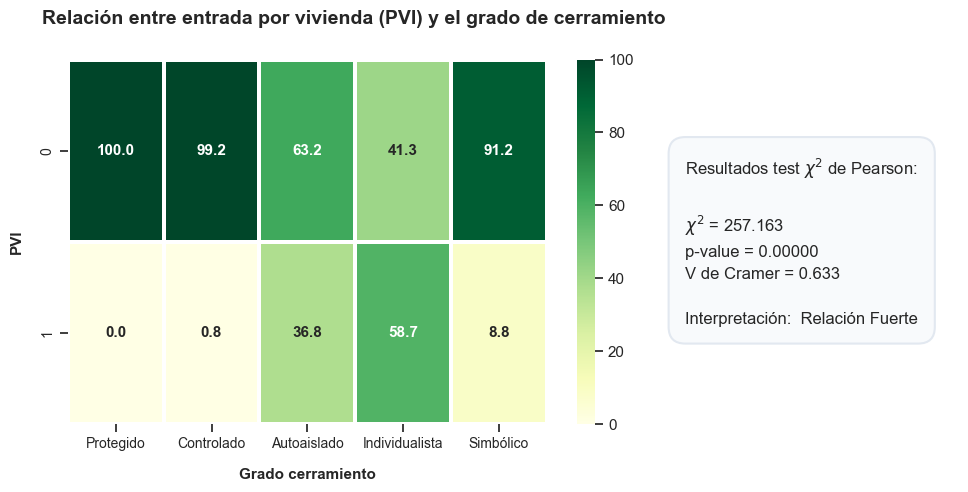

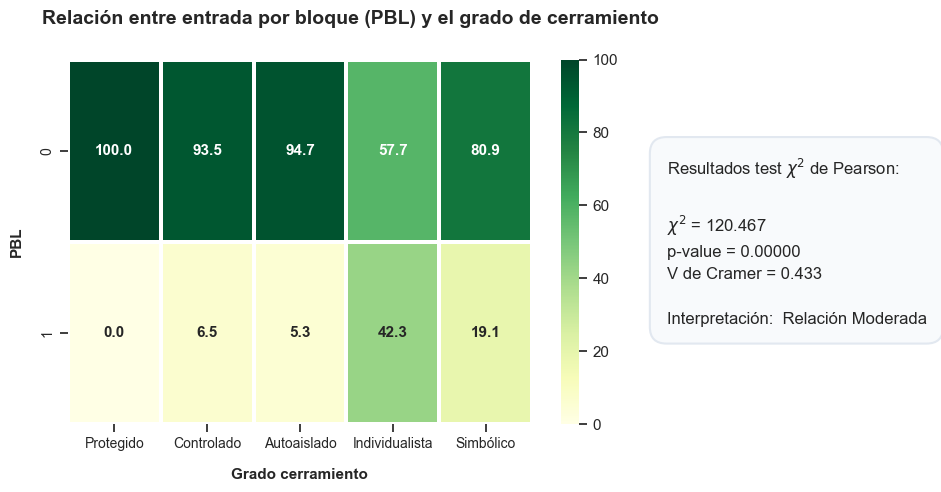

In [31]:
categorical_bivariate_analysis(df_acceso, "URB_label", "PVI", "Relación entre entrada por vivienda (PVI) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_acceso, "URB_label", "PBL", "Relación entre entrada por bloque (PBL) y el grado de cerramiento", name_var_dep="Grado cerramiento")

Los resultados del test $\chi^2$ de Pearson revelan una capacidad discriminativa considerable por parte de ambas variables.

Analizando las tablas de contingencia se observa una asociación entre el acceso por vivienda (**PVI**) y los complejos residenciales "Autoaislados" e "Individualistas", mientras que apenas está presente en el resto de grados de cerramiento. Por el contrario, el acceso por bloque (**PBL**) se concentra mayoritariamente en los complejos residenciales "Individualistas".

A continuación se estudia la relación de los tipos de acceso con entrada común o varias entradas comunes y la variable objetivo.

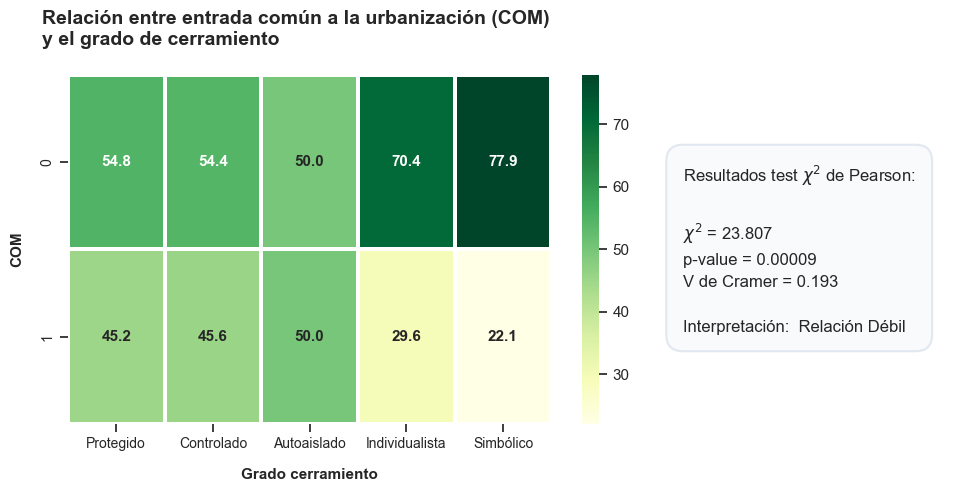

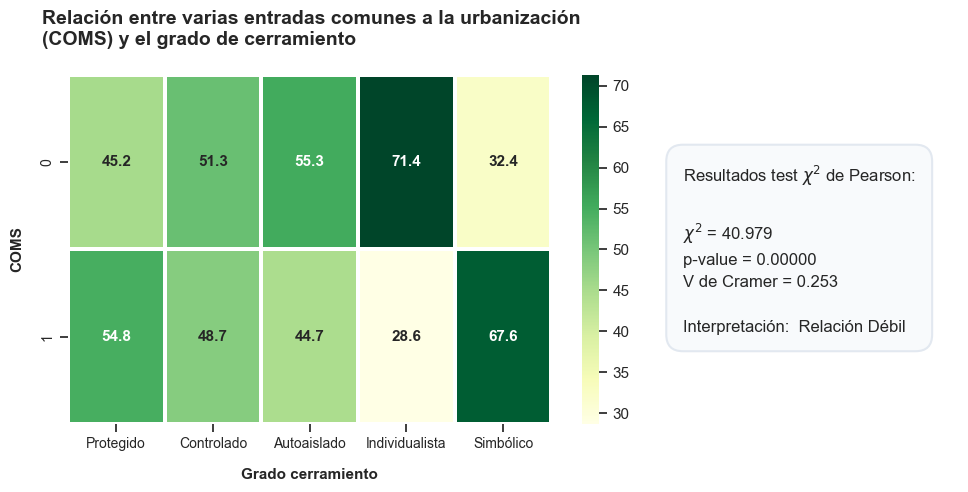

In [32]:
categorical_bivariate_analysis(df_acceso, "URB_label", "COM", "Relación entre entrada común a la urbanización (COM)\ny el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_acceso, "URB_label", "COMS", "Relación entre varias entradas comunes a la urbanización\n(COMS) y el grado de cerramiento", name_var_dep="Grado cerramiento")

Por el contrario, los puntos de acceso comunes (**COM** y **COMS**) presentan una asociación débil con el grado de cerramiento. En las categorías "Protegido", "Controlado" y "Autoaislado", las distribuciones de presencia y ausencia de ambas variables se mantienen próximas al $\approx50\%$, lo que limita su capacidad discriminativa individual.

En los complejos "Individualistas", la presencia de accesos comunes resulta poco frecuente tanto para la variable **COM** (entrada común) como para **COMS** (entradas comunes). Este resultado es coherente con el análisis previo de los puntos de acceso, donde esta tipología se caracteriza principalmente por accesos individuales a través de la vivienda (**PVI**) o del bloque (**PBL**), en lugar de accesos compartidos.

La similitud observada en el comportamiento de **COM** y **COMS** podría sugerir, en una primera aproximación, la conveniencia de agrupar ambas variables para eliminar redundancia y simplificar el conjunto de variables independientes. Sin embargo, esta similitud no se mantiene en todas las categorías de la variable objetivo. En particular, los complejos "Simbólicos" muestran una presencia claramente superior de **COMS** ($67.6\%$) frente a **COM** ($22.1\%$). Esta diferencia muestra que ambas variables capturan información parcialmente distinta lo que justifica mantenerlas como predictores independientes.

Más allá de la capacidad discriminativa individual de cada variable, el análisis conjunto de las variables pertenecientes al bloque "Puntos de acceso" permite identificar patrones de interés. Los complejos clasificados como "Protegidos", "Controlados" y "Simbólicos" presentan una baja frecuencia de accesos a través de la vivienda (**PVI**) o del bloque (**PBL**). En contraste, muestran una presencia significativa, aunque no necesariamente mayoritaria, de accesos comunes (**COM**) o de múltiples accesos comunes (**COMS**).

Este resultado pone de manifiesto que variables con una capacidad discriminativa individual reducida, como **COM** y **COMS**, pueden adquirir relevancia cuando se analizan conjuntamente con otras variables, como **PVI** y **PBL**. La combinación de estas características permite definir patrones más complejos y potencialmente más determinantes para caracterizar el grado de cerramiento de un complejo residencial.

Este tipo de relaciones multivariantes son capturadas por los modelos de clasificación durante el proceso de aprendizaje. Por este motivo, además de alcanzar un elevado rendimiento predictivo, resulta fundamental que los modelos sean interpretables. El presente trabajo se enmarca en un proyecto de transferencia de conocimiento entre la ciencia de datos y la sociología, donde la interpretabilidad no solo permite validar el comportamiento de los modelos, sino también generar conocimiento útil para los investigadores del dominio. De este modo, los patrones identificados por los algoritmos pueden contrastarse y complementarse con los marcos teóricos y conceptos urbanísticos propios del problema estudiado.

<a id="via_publica"></a>
## 4.5 Uso de la vía pública

Las variables de este bloque describen el régimen de uso de los viales interiores de los complejos residenciales. Se trata de variables mutuamente excluyentes, es decir, cada complejo residencial solo puede pertenecer a una de las siguientes categorías:
* **PPU**. Dominio público y de uso público.
* **PRE**. Dominio privado de uso público restringido.
* **PPR**. Dominio privado de uso privado.

Dado que estas categorías se han codificado mediante variables binarias, el carácter excluyente de las mismas implica que cada complejo residencial únicamente puede presentar valor (1) en una de las tres variables, mientras que las dos restantes toman necesariamente el valor (0).

A continuación se muestran ejemplos de complejos residenciales sin viales interiores, y con los tres tipos de uso de la vía pública.

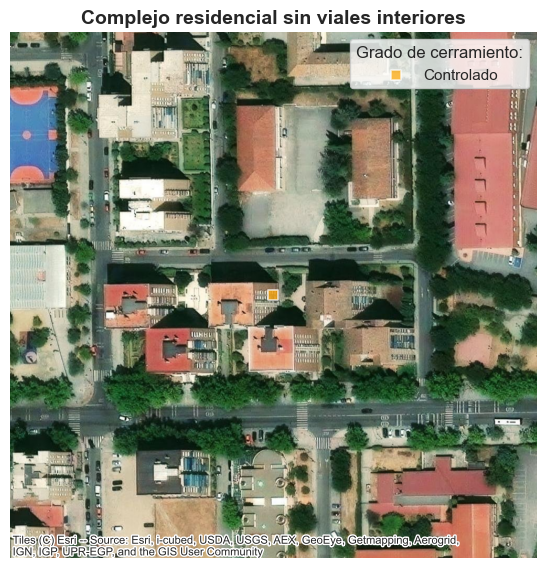

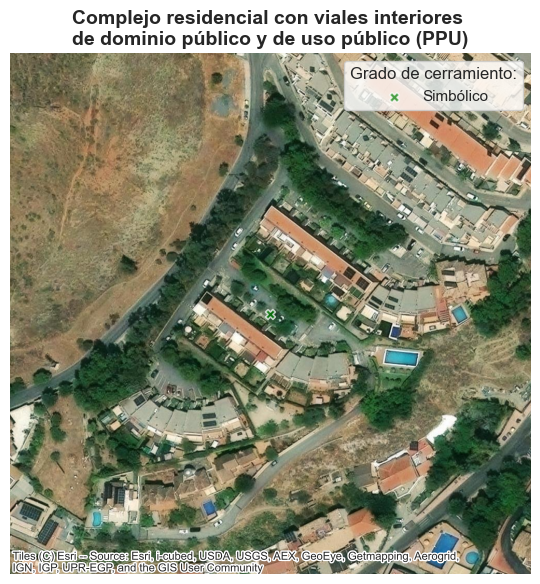

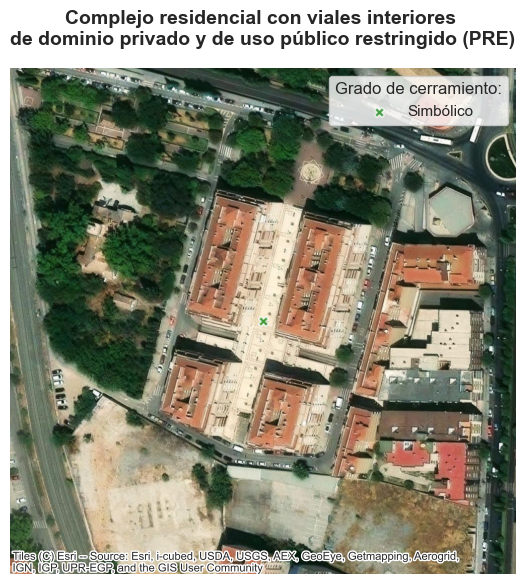

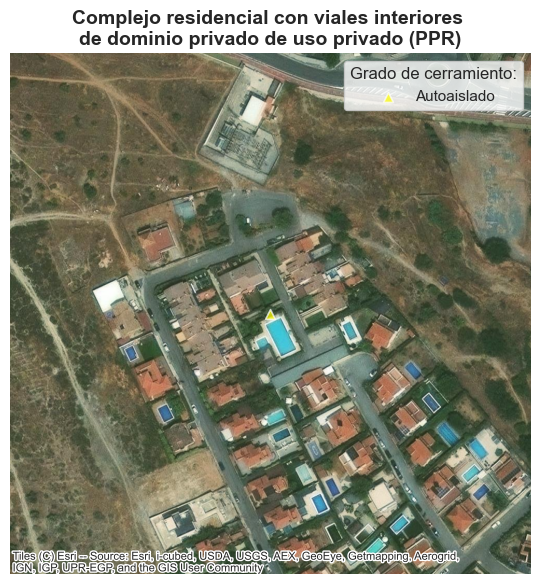

In [33]:
plot_fix_map(df[df["CC"]==8703011], "Complejo residencial sin viales interiores", figsize=(6,6))
plot_fix_map(df[df["CC"]==4701003], "Complejo residencial con viales interiores \nde dominio público y de uso público (PPU)", figsize=(6,6))
plot_fix_map(df[df["CC"]==8707007], "Complejo residencial con viales interiores \nde dominio privado y de uso público restringido (PRE)", figsize=(6,6))
plot_fix_map(df[df["CC"]==14901001], "Complejo residencial con viales interiores \nde dominio privado de uso privado (PPR)", figsize=(6,6))

Tanto la existencia de viales interiores como el régimen de uso asociado a estos pueden mantener una relación relevante con el grado de cerramiento. El uso público o privado de los viales condiciona el tránsito de personas ajenas al complejo residencial y, por tanto, su nivel de accesibilidad y permeabilidad respecto al entorno urbano externo.

Con el fin de verificar estas hipótesis, se analiza la relación entre las variables de este bloque y el grado de cerramiento. Para facilitar su representación e interpretación, las variables se recodifican en una única variable categórica que distingue entre complejos sin viales interiores y complejos con viales interiores clasificados según su régimen de uso (PPU, PPR o PRE).

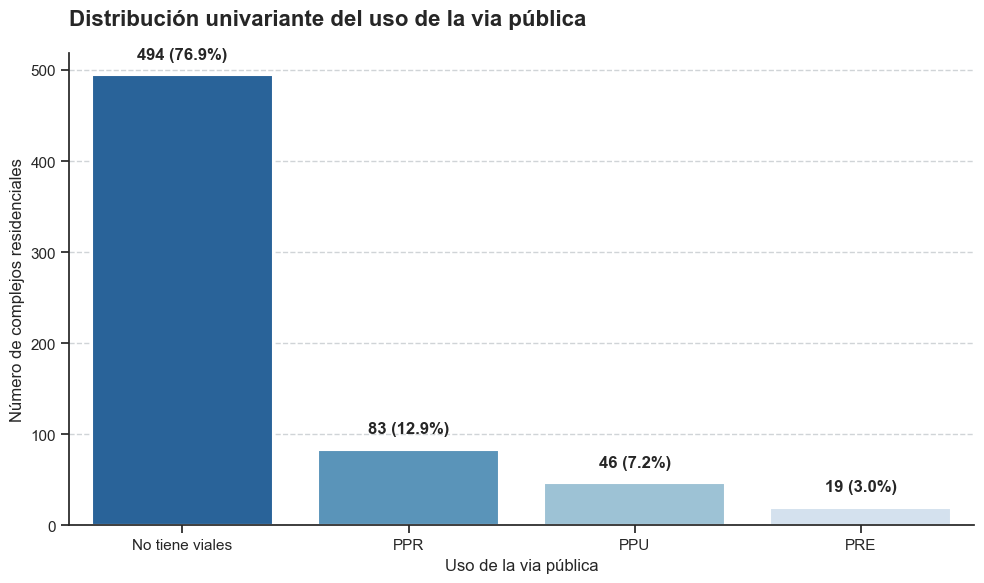

In [34]:
# Convertir las variables a entero
viales_cols = ["PPU", "PRE", "PPR"]
df[viales_cols] = df[viales_cols].astype(int)
# Copia de dataframe para EDA de las variables de este bloque
df_viales = df[viales_cols+["URB_label"]].copy()

def codificar_viales(row):
    # Se detectan las variables activas (valor 1)
    tipos_viales = row[viales_cols][row[viales_cols] == 1].index.tolist()

    # Complejos residenciales sin viales
    if len(tipos_viales) == 0:
        return "No tiene viales"
    elif len(tipos_viales) == 1:
        return tipos_viales[0]
    else:
        return "Más de un tipo de vial (Warning)"

df_viales["Uso de la via pública"] = df_viales.apply(codificar_viales, axis=1)
plot_univariate_distribution(df_viales, "Uso de la via pública",
                             title="Distribución univariante del uso de la via pública")

Un $76.9\%$ de los complejos residenciales no presentan viales interiores, esto es coherente con el análisis realizado en la sección [4.1.1 Tipos de calles](#tipos_de_calles) en la que se observa que la presencia de calles sin salida, calles en fondo de saco o calles peatonales no es frecuente en los complejos residenciales de la base de datos.

El $23.1\%$ restante tiene algún tipo de vial interior. Predominan el dominio y uso privado (**PPR**) con un $12.9\%$ seguido del dominio y uso público (**PPU**) con un $7.2\%$ y el uso menos frecuente presente en un $3\%$ de los complejos es el dominio privado con uso público restringido (**PRE**).

A continuación se analiza la relación entre el uso de la vía pública y el grado de cerramiento a través de la tabla de contingencia y test $\chi^2$ de Pearson.

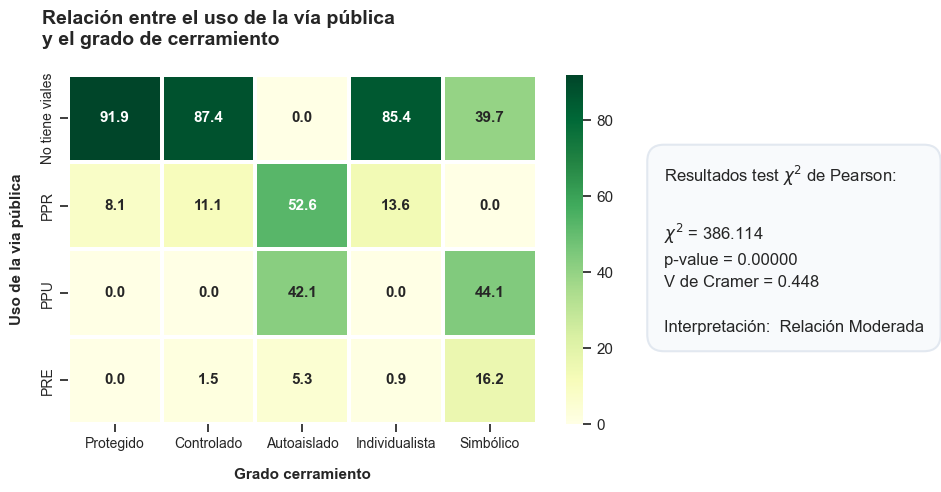

In [35]:
categorical_bivariate_analysis(df_viales, "URB_label", "Uso de la via pública", "Relación entre el uso de la vía pública\ny el grado de cerramiento", name_var_dep="Grado cerramiento")

La relación entre el uso de las viales y la variable objetivo es moderada y presenta asociaciones relevantes.

Los complejos residenciales en ausencia de viales interiores tienden a pertenecer de forma mayoritaria a las tipologías de cerramiento "Protegido", "Controlado" e "Individualista", un resultado coherente con las características que definen estos grados de cerramiento.

Los viales de dominio y uso privado (**PPR**) se concentran principalmente en los complejos residenciales "Autoaislados", mientras que los viales de dominio y uso público (**PPU**) presentan una presencia destacada tanto en los complejos "Autoaislados" como en los "Simbólicos". Este resultado sugiere que el grado de cerramiento "Autoaislado" puede asociarse a usos viales opuestos, desde modelos completamente privados hasta modelos completamente públicos.


En contraste, el régimen intermedio de dominio privado y uso público restringido (**PRE**) aparece de forma predominante en los complejos residenciales "Simbólicos". En conjunto, la presencia de viales interiores parece constituir una característica común en los complejos "Autoaislados" y "Simbólicos". Sin embargo, la capacidad discriminativa individual del tipo de uso vial resulta más evidente en el caso de los complejos "Simbólicos", mientras que para los "Autoaislados" la distribución observada entre los usos **PPU** y **PPR** es muy similar, lo que limita su capacidad para diferenciar esta categoría de forma aislada.

<a id="seguridad"></a>
## 4.6 Seguridad y vigilancia

Este bloque de variables aporta información sobre que tipo de servicios y mecanismos de seguridad están disponibles en los complejos residenciales. Conceptualmente, la presencia de estos elementos se asocia a un grado de cerramiento de alta intensidad.

A continuación se representa el número de complejos residenciales, y porcentaje respecto al total, que cuentan con cada uno de estos dispositivos. Un mismo complejo residencial puede tener más de un mecanismo de seguridad.

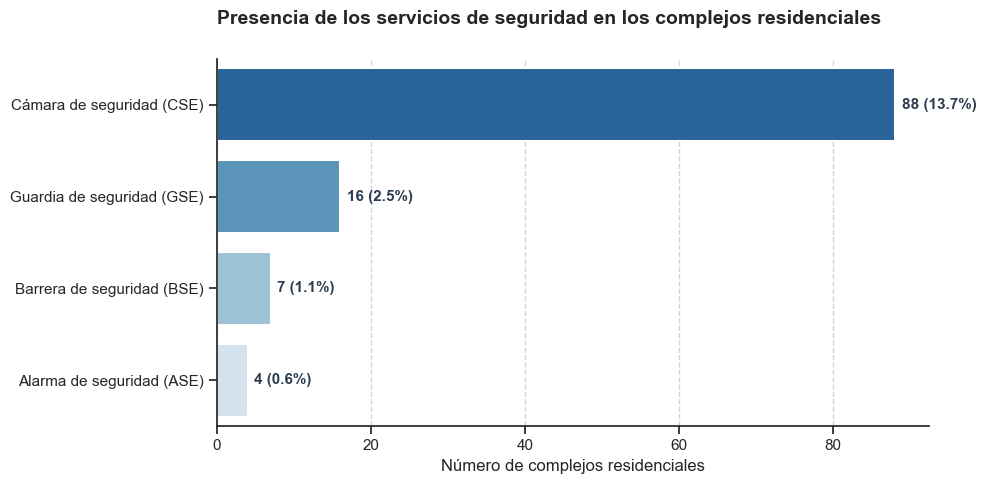

In [36]:
# Convertir las variables a entero
seg_cols = ["GSE", "CSE", "BSE", "ASE"]
df[seg_cols] = df[seg_cols].astype(int)
# Copia de dataframe para EDA de las variables de este bloque
df_seg = df[seg_cols+["URB_label"]].copy()
plot_variable_occurrences(df_seg, seg_cols, title="Presencia de los servicios de seguridad en los complejos residenciales",
                               dict_label={
                                        "GSE": "Guardia de seguridad (GSE)",
                                        "CSE": "Cámara de seguridad (CSE)",
                                        "BSE": "Barrera de seguridad (BSE)",
                                        "ASE": "Alarma de seguridad (ASE)"})

Los complejos residenciales con servicios de seguridad representan un porcentaje muy reducido de la base de datos. Un $13.7\%$ cuentan con camaras de seguridad (**CSE**) mientras que tan solo un $4.2\%$ tiene al menos alarma, guardia o barrera de seguridad.

Esta baja variabilidad, especialmente en las variables **GSE** y **BSE** reduce la potencia estadística del test $\chi^2$ de Pearson para determinar si existe relación significativa entre estas variables y la variable objetivo. En este caso, el análisis realizado se centra en la interpretación de las tablas de contingencia.

A continuación se muestran los resultados obtenidos para cada variable de este bloque.

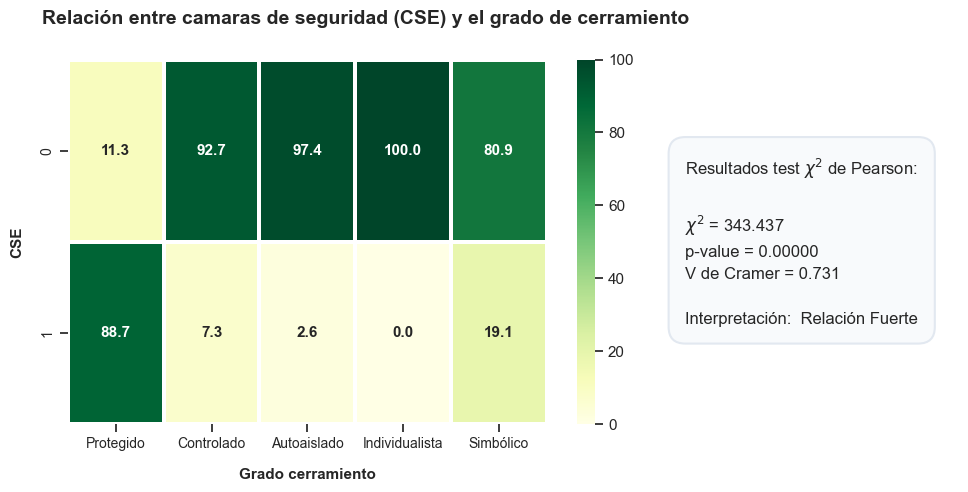

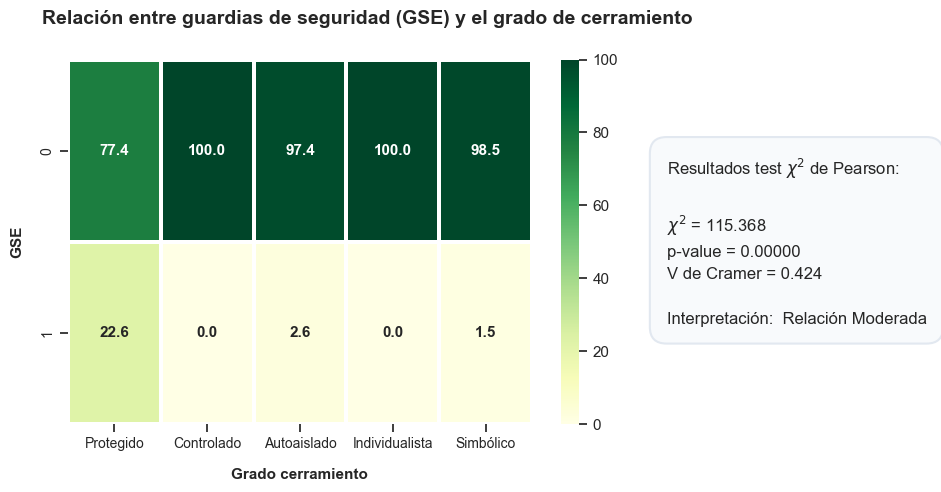

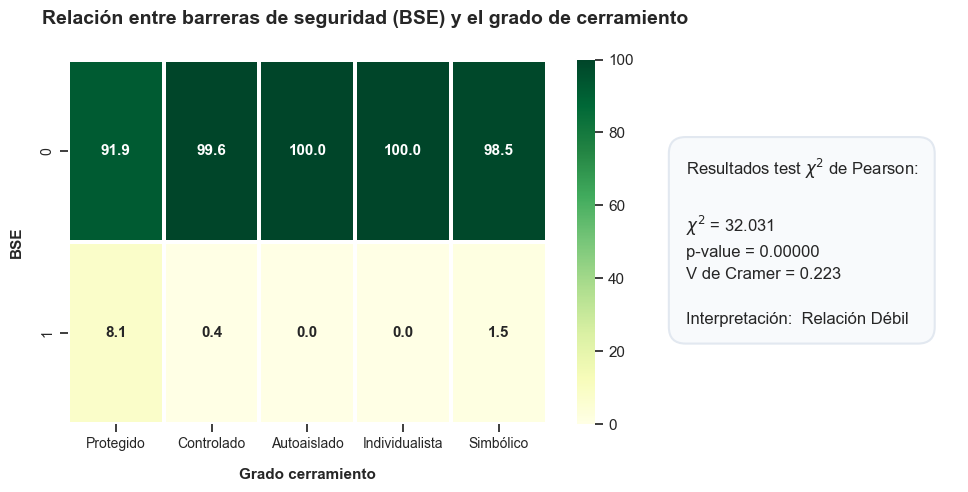

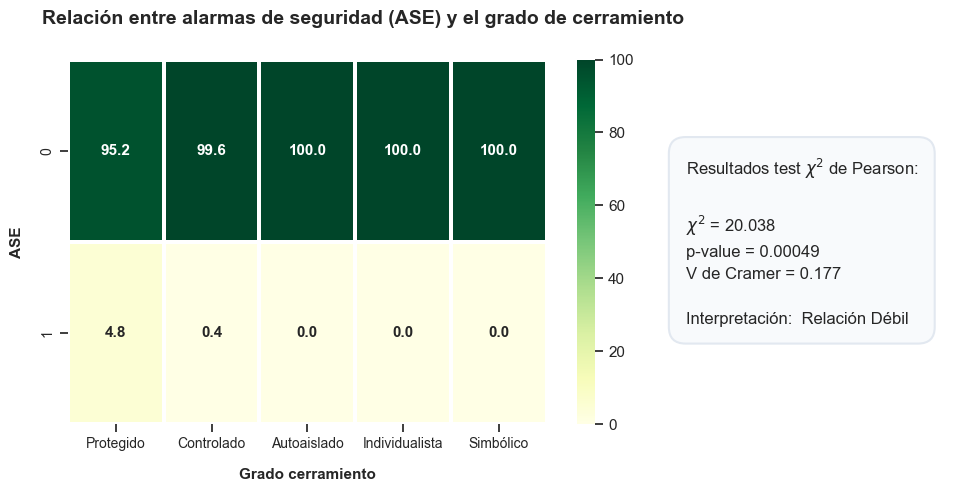

In [37]:
categorical_bivariate_analysis(df_seg, "URB_label", "CSE", "Relación entre camaras de seguridad (CSE) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_seg, "URB_label", "GSE", "Relación entre guardias de seguridad (GSE) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_seg, "URB_label", "BSE", "Relación entre barreras de seguridad (BSE) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_seg, "URB_label", "ASE", "Relación entre alarmas de seguridad (ASE) y el grado de cerramiento", name_var_dep="Grado cerramiento")

Las variables de este bloque presentan un comportamiento consistente en su relación con la variable objetivo. Todos los mecanismos de seguridad analizados tienden a concentrarse de forma mayoritaria en los complejos residenciales "Protegidos", tipología que representa el grado de cerramiento más elevado.

El test $\chi^2$ de Pearson permite rechazar la hipótesis de independencia en las cuatro relaciones estudiadas. No obstante, el coeficiente $V$ de Cramer únicamente indica una asociación fuerte en el caso de las cámaras de seguridad **CSE**. Este resultado puede explicarse por la mayor frecuencia de esta variable en la muestra, lo que proporciona una mayor capacidad para detectar asociaciones estadísticamente relevantes en comparación con el resto de mecanismos de seguridad, cuya presencia es más reducida. Asimismo, destaca la presencia de cámaras de seguridad en un $19.1\%$ de los complejos residenciales "Simbólicos". Más allá de esta asociación, las tablas de contingencia no evidencian relaciones relevantes entre los distintos mecanismos de seguridad y las restantes tipologías de cerramiento.

La homogeneidad observada en el comportamiento de estas variables podría justificar su agregación en una única variable indicadora de la existencia de al menos un mecanismo de seguridad en el complejo residencial:
$$SEG = GSE \vee ASE \vee BSE \vee CSE$$

Sin embargo, uno de los principales objetivos de este trabajo es analizar la interpretabilidad de los modelos de clasificación. Aunque todas las variables se asocien predominantemente con la misma tipología de cerramiento, cada una representa un mecanismo de seguridad diferente y, por tanto, aporta un significado semántico particular. Desde una perspectiva urbanística, la presencia de una barrera de seguridad no implica necesariamente el mismo nivel de control o restricción que la existencia de un guardia de seguridad o de un sistema de videovigilancia.

Por este motivo, resulta conveniente mantener inicialmente las variables de forma independiente y evaluar posteriormente su contribución durante la fase de interpretabilidad. Este análisis permitirá determinar qué mecanismos están influyendo realmente en las decisiones de clasificación de los modelos y cuáles podrían estar aportando información redundante o ruido. A partir de estos resultados, podría considerarse tanto la agregación de las variables en una única medida de seguridad como la eliminación de aquellas que presentan una variabilidad muy reducida, como es el caso de **ASE**.

<a id="variable_predictoras_correlacion"></a>
## 4.7. Relación entre las variables independientes (predictoras)

Tras haber estudiado la relación de cada variable independiente (predictora) con la variable dependiente (objetivo), se procede a analizar la relación existente entre las propias variables independientes. El objetivo es identificar la existencia de variables altamente correlacionadas y utilizar esta información como apoyo a la toma de decisiones en cuanto a la exclusión o fusión de variables durante la fase de interpretabilidad de los modelos de clasificación.

Para ello se utiliza el coeficiente de correlación Phi ($\phi$) que es una medida estadística utilizada para cuantificar la asociación entre dos variables binarias. Es equivalente al coeficiente de correlación de Pearson cuando ambas variables toman valores 0 y 1. Su formulación se basa en la tabla de contingencia $2×2$ de las dos variables consideradas ($X_1$ y $X_2$):
$$\phi = \frac{ad - bc}{\sqrt{(a+b)(c+d)(a+c)(b+d)}}$$

donde:
* a: Número de observaciones donde $X_1=1$ y $X_2=1$.
* b: Número de observaciones donde $X_1=1$ y $X_2=0$.
* c: Número de observaciones donde $X_1=0$ y $X_2=1$.
* d: Número de observaciones donde $X_1=0$ y $X_2=0$.

Este coeficiente toma valores en el rango $[-1,1]$ donde:
* Valores cercanos a $1$ indican asociación positiva.
* Valores cercanos a $-1$ indican asociación negativa.
* Valores cercanos a $0$ indican independencia estadística entre variables.

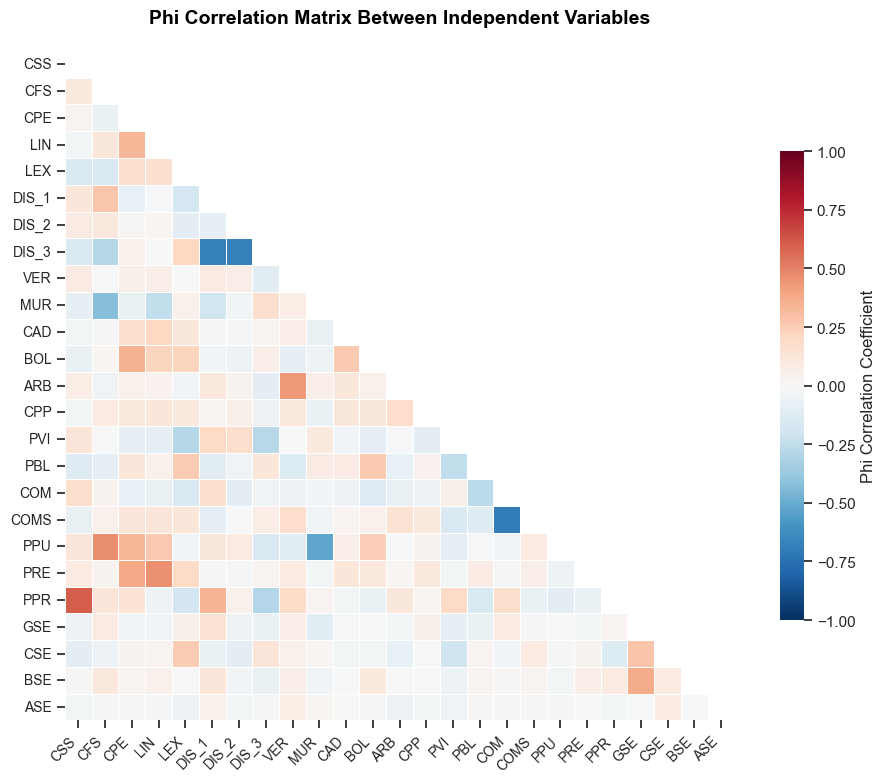

Variables with correlation coefficient |Phi| > 0.45:
Variable_1 Variable_2    Phi
       CSS        PPR  0.607
       CFS        PPU  0.465
       LIN        PRE  0.458
       MUR        PPU -0.530
     DIS_1      DIS_3 -0.675
     DIS_2      DIS_3 -0.675
       COM       COMS -0.700


In [38]:
# Seleccionar variables independientes
col_estructural = ["CSS", "CFS", "CPE", "LIN", "LEX"]
col_dist = ["DIS_1", "DIS_2", "DIS_3"]
col_cerramiento = ["VER", "MUR", "CAD", "BOL", "ARB", "CPP"]
col_acceso = ["PVI", "PBL", "COM", "COMS"]
col_via = ["PPU", "PRE", "PPR"]
col_seg = ["GSE", "CSE", "BSE", "ASE"]
X = df[col_estructural + col_dist + col_cerramiento + col_acceso + col_via + col_seg]

# Plot correlation matrix 
phi_corr_df = phi_correlation(X)

Sobre la matriz de correlación $\phi$ se observa, que de forma general, los valores de correlación tienden a ser cercanos a cero. Esto indica que existe una baja redundancia entre las variables independientes. En la tabla se muestran los pares de variables que presentan las correlaciones más altas, para ello se usa un umbral de correlación $\phi$ de valor $\pm0.45$.

Algunas variables de este conjunto de datos se comportan como una codificación *dummy (One-Hot Encoding)*, es decir que la presencia de una implica la ausencia de la otra. Este fenómeno provoca la obtención de valores de correlación $\phi$ muy negativos.

Esto se observa en los pares de variable *DIS_1-DIS_3* y *DIS_2-DIS_3* puesto que un complejo residencial solo puede tener un tipo de distancia al núcleo úrbano principal. Ocurre lo mismo en la pareja *COM-COMS*, un complejo residencial puede tener una entrada común a la urbanización ($COM=1$) o varias entradas ($COMS=1$), pero no ambas opciones simultaneamente.

El resto de parejas de variables muestran una asociación relevante pero con valores moderados, la mayor correlación $\phi$ en términos absolutos es de valor $0.6$ lo que refuerza la idea de que existe baja redundancia entre las variables y que cada una mantiene capacidad discriminativa individial propia.

En las 4 parejas de variables con un coeficiente de correlación $\phi$ superior al umbral, las variables implicadas pertenecen a bloques semánticos distintos.  Al tratarse de variables conceptualmente distintas y presentar coeficientes de correlación moderados, no se considera necesario prescindir de ninguna variable por motivos de redundancia o alta correlación.

<a id="construccion_datos"></a>
# 5. Construcción de los conjuntos de datos de trabajo

Tras realizar el análisis exploratorio de la base de datos, se construyen dos conjuntos de datos diferenciados, cada uno con un propósito específico dentro del flujo de trabajo. Ambos conjuntos incorporan la variable **CC**, que actúa como identificador único y permite establecer la correspondencia entre ellos cuando sea necesario.

* **descriptive_data**. Este conjunto de datos contiene todas las variables descriptivas. Esta información se utilizará con fines analíticos o para desarrollar visualizaciones sobre los resultados obtenidos.

* **model_data**. Este conjunto de datos contiene todas las variables independientes (predictoras), junto con la variable dependiente. Este *dataset* constituye la matriz de datos preparada para entrenar y evaluar los modelos de aprendizaje automático.

<a id="datos_descriptivos"></a>
## 5.1 Conjunto de datos descriptivo

Este conjunto de datos incluye las variables descriptivas o informativas. Del bloque temático "Información general" se excluyen los identificadores catastrales, puesto que se trata de información sin relevancia para los propósitos de este trabajo. Por otro lado, dentro del bloque temático "Características básicas", se han eliminado las variables **Año** y **AñoPri**, debido a que la información contenida en ambas queda representada por la variable **AñoFin**, evitando así la redundancia de información dentro del conjunto de datos.

A continuación, se presentan los bloques temáticos incluidos en este conjunto de datos, junto con las variables que componen cada uno de ellos.

**Información general**

- **CC**. Identificador único del complejo residencial.
- **MUN**. Municipio para tareas de visualización o agrupamiento.
- **LAT y LON**. Las coordenadas de latitud y longitud son utilizadas para tareas de visualización.

**Características básicas**

- **AñoFin**. Año en el que finaliza la construcción del complejo residencial. Esta variable es renombrada a YEAR para evitar el uso del caracter Ñ.
- **SUP**. Superficie ocupada por el complejo residencial en metros cuadrados.
- **NVIV**. Número de viviendas que componen el complejo residencial.

**Tipo de residencia**

* **VAI**. Viviendas unifamiliares aisladas.
* **VPA**. Viviendas unifamiliares pareadas y otras.
* **VAD**. Viviendas unifamiliares adosadas.
* **PMC**. Pisos en manzana cerrada.
* **PMA**. Pisos en manzana abierta.
* **CON**. En construcción.

**Equipamientos comunes**

* **PIS**. Piscina.
* **PTP**. Pista de Tenis/Padel.
* **PBA**. Pista de Baloncesto.
* **CFU**. Campo de fútbol.
* **CGO**. Campo de Golf.
* **GIM**. Gimnasio.
* **PAR**. Parque Infantil.
* **MOB**. Patio con Mobiliario.
* **JAR**. Jardines/Parques.

In [39]:
# Creacion del dataset
info_cols = ["CC", "MUN", "LAT", "LON"]
basic_cols = ["AñoFin", "SUP", "NVIV"]
res_cols = ["VAI", "VPA", "VAD", "PMC", "PMA", "CON"]
equip_cols = ["PIS","PTP","PBA", "CFU", "CGO", "GIM", "PAR", "MOB", "JAR"]
descriptive_df = df[info_cols+basic_cols+res_cols+equip_cols].copy().rename(columns={"AñoFin": "YEAR"})
print("Conjunto de datos descriptivo (primeras cinco filas)")
descriptive_df.head()

Conjunto de datos descriptivo (primeras cinco filas)


,CC,MUN,LAT,LON,YEAR,SUP,NVIV,VAI,VPA,VAD,PMC,PMA,CON,PIS,PTP,PBA,CFU,CGO,GIM,PAR,MOB,JAR
0,301014,ALBOLOTE,440856.399,4126716.381,2011,14519.63,61,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1
1,301015,ALBOLOTE,440502.598,4126703.923,1986,6190.15,13,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,301016,ALBOLOTE,440487.649,4126771.195,1986,5006.58,10,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1
3,301017,ALBOLOTE,440549.938,4126833.484,1986,5196.59,10,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1
4,301018,ALBOLOTE,440597.277,4126783.653,1986,5079.12,10,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1


In [40]:
descriptive_df.to_csv(cfg.DATA_PROCESSED_DIR/"descriptive_data.csv", index=False, encoding="utf-8")
print("DataFrame almacenado en fichero csv.")

DataFrame almacenado en fichero csv.


<a id="model_data"></a>
## 5.2 Conjunto de datos para entrenamiento y evaluación de modelos

Este conjunto de datos incluye todas las variables independientes (predictoras) junto con la variable dependiente (objetivo). Este es el conjunto de datos utilizado para entrenar y evaluar los modelos de aprendizaje automático.

Se incluye la variable **CC**, que actúa como identificador único de cada complejo residencial. Aunque esta variable no participa en el proceso de modelado, se conserva con el fin de mantener la trazabilidad de los registros y facilitar la vinculación con el conjunto de datos *descriptive_data*. De este modo, es posible recuperar en cualquier momento la información descriptiva asociada a cada observación para su posterior análisis e interpretación de resultados.

A continuación, se presentan los bloques temáticos incluidos en este conjunto de datos, junto con las variables que componen cada uno de ellos.

**Información general**
* **CC**. Identificador único del complejo residencial.

**Aspectos estructurales**
* **CSS**. Calles sin salida.
* **CFS**. Calles en fondo de saco.
* **CPE**. Calle peatonal.
* **LIN**. Comercios internos.
* **LEX**. Comercios externos.

**Distancia al núcleo urbano principal**
* **DIS_1**. Representa la categoría *Urbanización aislada*.
* **DIS_2**. Representa la categoría *Urbanización separada*.
* **DIS_3**. Representa la categoría *Urbanización integrada en casco urbano*.

**Tipo de Cerramiento**
* **VER**. Verjas o Vallas.
* **MUR**. Muros.
* **CAD**. Cadenas.
* **BOL**. Bolardos.
* **ARB**. Arbustos.
* **CPP**. Carteles de propiedad privada.

**Puntos de acceso**
* **PVI**. Entrada por vivienda.
* **PBL**. Entrada por bloque.
* **COM**. Entrada común a la urbanización
* **COMS**. Varias entradas comunes a la urbanización.

**Uso de vía pública**
* **PPU**. Dominio público y de uso público.
* **PRE**. Dominio privado de uso público restringido.
* **PPR**. Dominio privado de uso privado.

**Seguridad y vigilancia**
* **GSE**. Guardia de seguridad.
* **CSE**. Cámaras de seguridad.
* **BSE**. Barrera de seguridad.
* **ASE**. Alarma de seguridad.

**Variable objetivo: Clasificación de referencia**
* **URB**. Clasificación tipológica de cerramiento.

In [41]:
valid_df = df[["CC"]+col_estructural+col_dist+col_cerramiento+col_acceso+col_via+col_seg+["URB"]].copy()
print(f"Número de variables independientes: {valid_df.shape[1]-2}")
valid_df.head()

Número de variables independientes: 25


,CC,CSS,CFS,CPE,LIN,LEX,DIS_1,DIS_2,DIS_3,VER,MUR,CAD,BOL,ARB,CPP,PVI,PBL,COM,COMS,PPU,PRE,PPR,GSE,CSE,BSE,ASE,URB
0,301014,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1
1,301015,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,4
2,301016,0,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,4
3,301017,0,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,4
4,301018,0,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,4


In [42]:
valid_df.to_csv(cfg.DATA_PROCESSED_DIR/"model_data.csv", index=False, encoding="utf-8")
print("DataFrame almacenado en fichero csv.")

DataFrame almacenado en fichero csv.


<a id="anexo_a"></a>
# Anexo A: Análisis exploratorio de las variables descriptivas: Tipo de residencia y equipamientos comunes

En este ánexo se realiza un análisis exploratorio de las variables descriptivas de los bloques temáticos "Tipo de residencia" y "Equipamientos comunes". Tal y como se ha descrito en la seccion [3.3 Tipos de residencia y equipamientos comunes](#tipo_de_residencia), estas variables han sido recopiladas con fines descriptivos que permiten caracterizar el tipo de viviendas y equipamientos comunes que alberga el complejo residencial.

A pesar de tratarse de variables descriptivas que no han sido utilizadas en la clasificación de referencia, en esta sección se aporta un análisis exploratorio complementario con el objetivo de conocer en profundiad la base de datos y estudiar la existencia de posibles asociaciones con la variable objetivo. Dado que se trata de variables categórico binarias se utilizan las mismas herramientas de análisis presentadas en la sección [4. Análisis exploratorio de las variables independientes (predictoras)](#variable_predictoras_eda) (tabla de contingencia, test $\chi^2$ de Pearson y coeficiente $V$ de Cramer).

<a id="anexo_tipo_de_residencia"></a>
## A.1 Tipo de residencia

Estas variables indican el tipo de residencias que existen en el complejo residencial. En el siguiente gráfico de barras se representa el número de complejos residenciales, y porcentaje respecto al total, que tienen cada tipo de vivienda. Cabe destacar que en un mismo complejo residencial puede haber más de un tipo de vivienda.

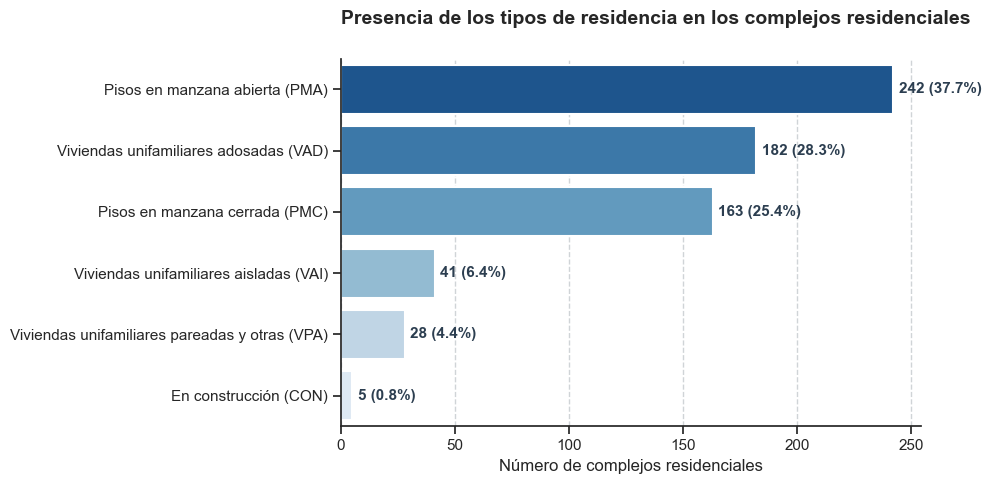

In [43]:
# Convertir las variables a entero
residencia_cols = ["VAI", "VPA", "VAD", "PMC", "PMA", "CON"]
df[residencia_cols] = df[residencia_cols].astype(int)
# Copia de dataframe para EDA de las variables de este bloque
df_residencia = df[residencia_cols+["URB_label"]].copy()
plot_variable_occurrences(df_residencia, residencia_cols, title="Presencia de los tipos de residencia en los complejos residenciales",
                               dict_label={
                                        "VAI": "Viviendas unifamiliares aisladas (VAI)",
                                        "VPA": "Viviendas unifamiliares pareadas y otras (VPA)",
                                        "VAD": "Viviendas unifamiliares adosadas (VAD)",
                                        "PMC": "Pisos en manzana cerrada (PMC)",
                                        "PMA": "Pisos en manzana abierta (PMA)",
                                        "CON": "En construcción (CON)"
                                        })

La distribución de los tipos de residencia muestra una clara predominancia de los complejos residenciales compuestos por pisos (**PMA** y **PMC**) frente a aquellos basados en viviendas unifamiliares. Dentro de este último grupo, destacan notablemente las viviendas adosadas (**VAD**) respecto a las viviendas aisladas (**VAI**) y pareadas (**VPA**).

En primer lugar, se analiza la relación de los dos tipos de edificaciones basadas en pisos y el grado de cerramiento.

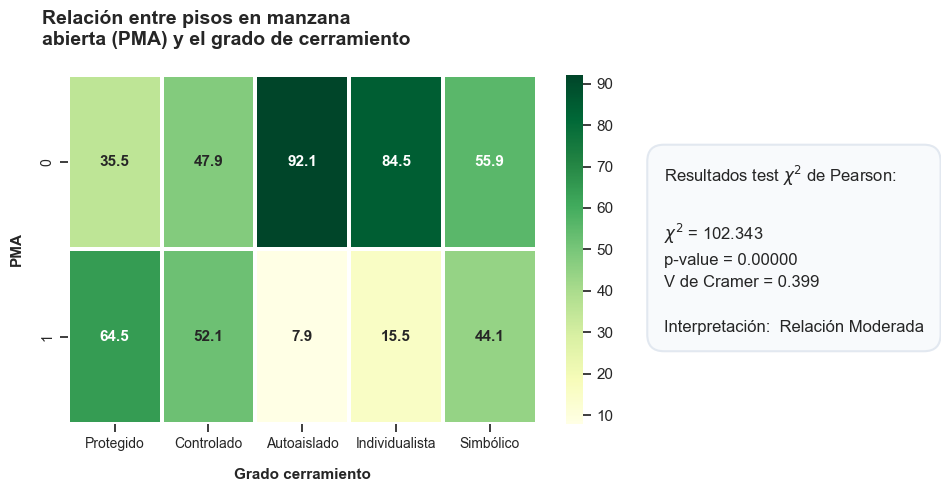

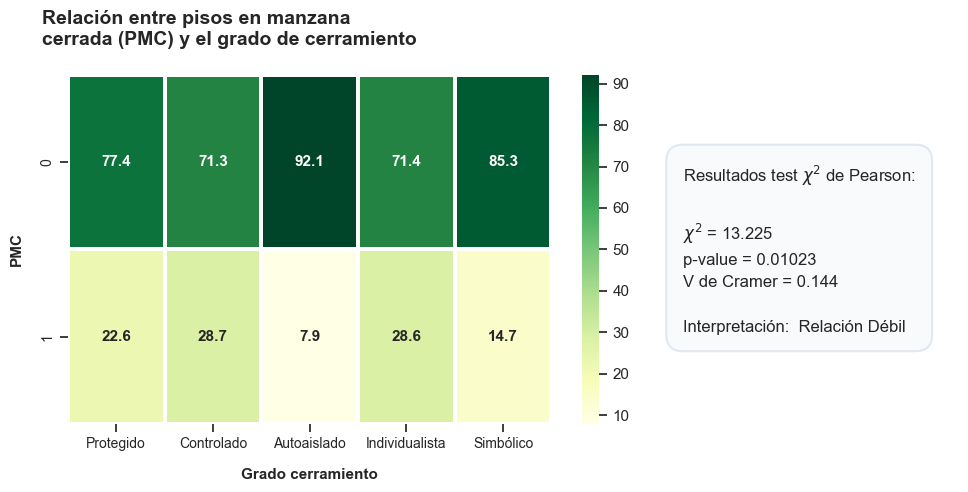

In [44]:
categorical_bivariate_analysis(df_residencia, "URB_label", "PMA", "Relación entre pisos en manzana\nabierta (PMA) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_residencia, "URB_label", "PMC", "Relación entre pisos en manzana\ncerrada (PMC) y el grado de cerramiento", name_var_dep="Grado cerramiento")

Los pisos en manzana abierta (**PMA**) tienden a tener una mayor presencia en los complejos residenciales "Protegidos", "Controlados" y "Simbólicos" mientras que los pisos en manzana cerrada (**PMC**) presentan una asociación muy débil con la variable objetivo, puesto que su presencia es muy homogénea en todos los grados de cerramiento.

A continuación, se estudia la relación entre las edificaciones basadas en viviendas unifamiliares y el grado de cerramiento. Este análisis no se aplica a las edificaciones en construcción (**CON**), debido a su escasa representación en la muestra (presentes únicamente en el ($0.8\%$) de los complejos residenciales) y a la limitada relevancia semántica de esta categoría para el objetivo del estudio.

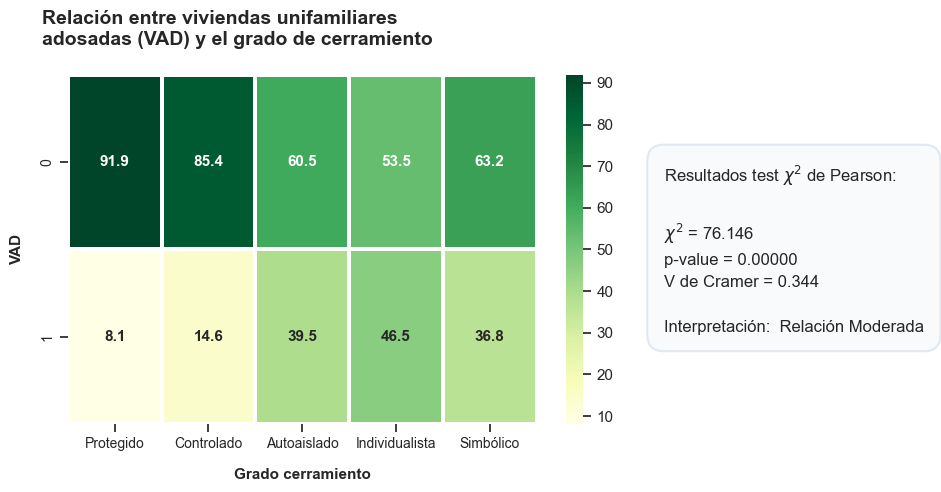

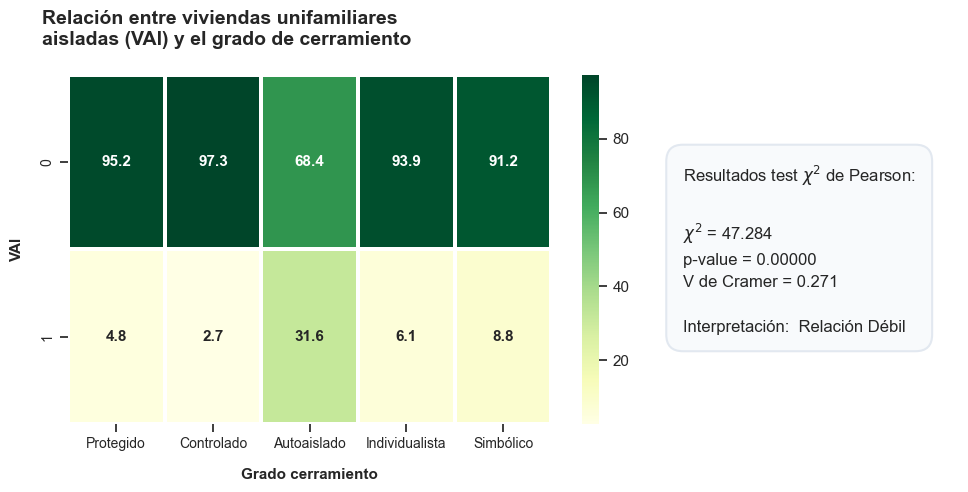

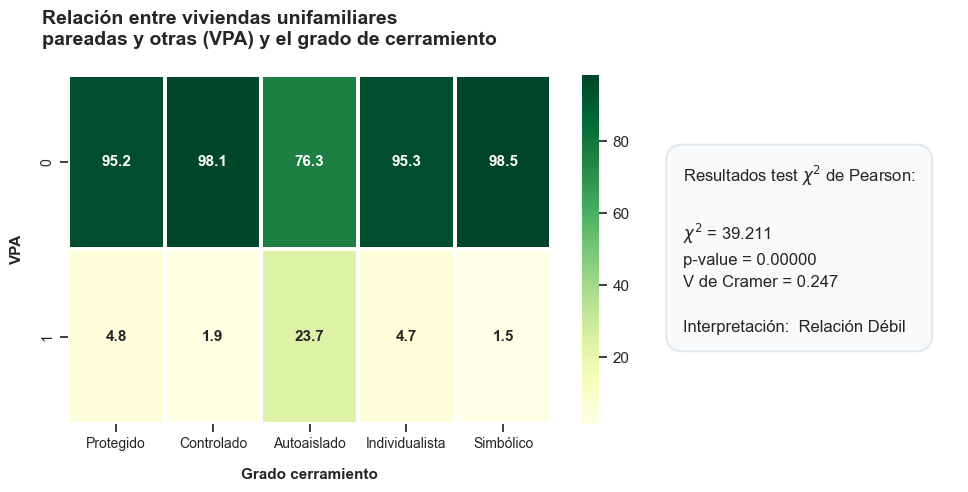

In [45]:
categorical_bivariate_analysis(df_residencia, "URB_label", "VAD", "Relación entre viviendas unifamiliares\nadosadas (VAD) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_residencia, "URB_label", "VAI", "Relación entre viviendas unifamiliares\naisladas (VAI) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_residencia, "URB_label", "VPA", "Relación entre viviendas unifamiliares\npareadas y otras (VPA) y el grado de cerramiento", name_var_dep="Grado cerramiento")

El análisis de las tablas de contingencia muestra que la asociación entre los distintos tipos de viviendas y la tipología de cerramiento es, en términos generales, débil.

Las viviendas unifamiliares aisladas (**VAI**) y pareadas (**VPA**) presentan una ligera tendencia a concentrarse en complejos residenciales "Autoaislados". Sin embargo, esta asociación carece de una interpretación directa desde la perspectiva del grado de cerramiento y podría estar condicionada por factores externos al análisis, como la localización de este tipo de desarrollos urbanísticos en zonas periféricas del área metropolitana de Granada. Además, la baja frecuencia de estas tipologías en la muestra limita la posibilidad de extraer conclusiones robustas. Por el contrario,  las viviendas unifamiliares adosadas (**VAD**) muestran una distribución relativamente homogénea entre los complejos "Autoaislados", "Individualistas" y "Simbólicos".

En los tres tipos de viviendas, la presencia en los complejos residenciales de mayor grado de cerramiento,"Protegidos" y "Controlados", es muy baja. Considerando conjuntamente este resultado y la asociación observada entre los pisos en manzana abierta (**PMA**) y los grados de cerramiento más elevados, podría plantearse la hipótesis de que determinados tipos de edificaciones basadas en pisos favorecen una mayor presencia de mecanismos de cerramiento que las tipologías basadas en viviendas unifamiliares.

Sin embargo, la ausencia de una asociación relevante en los pisos en manzana cerrada (**PMC**) no refuerza dicha hipótesis, lo que dificulta establecer una relación consistente entre el tipo de edificación y el grado de cerramiento. En consecuencia, las asociaciones identificadas, en este bloque de variables, presentan una capacidad interpretativa limitada y no aportan evidencias suficientemente sólidas para justificar su inclusión en los modelos de clasificación.

A pesar de ello, los resultados obtenidos pueden resultar de interés desde una perspectiva urbanística y sociológica. En particular, sugieren la posibilidad de explorar en futuros trabajos si determinados desarrollos urbanísticos del área metropolitana de Granada tienden a favorecer ciertos tipos de edificación asociados, directa o indirectamente, a diferentes grados de cerramiento residencial.

<a id="equipamientos_comunes"></a>
## A.2 Equipamientos comunes

Las variables de este bloque fueron recopiladas con fines descriptivos puesto que para que un desarrollo urbanístico cumpla con la definición de complejo residencial, es necesario qe cuente con al menos uno de estos elementos. En el siguiente gráfico de barras se muestra el número de complejos residenciales, y porcentaje respecto al total, que cuentan con cada uno de estos equipamientos comunes. Cabe destacar que en un mismo complejo residencial pueden existir más de uno de ellos.


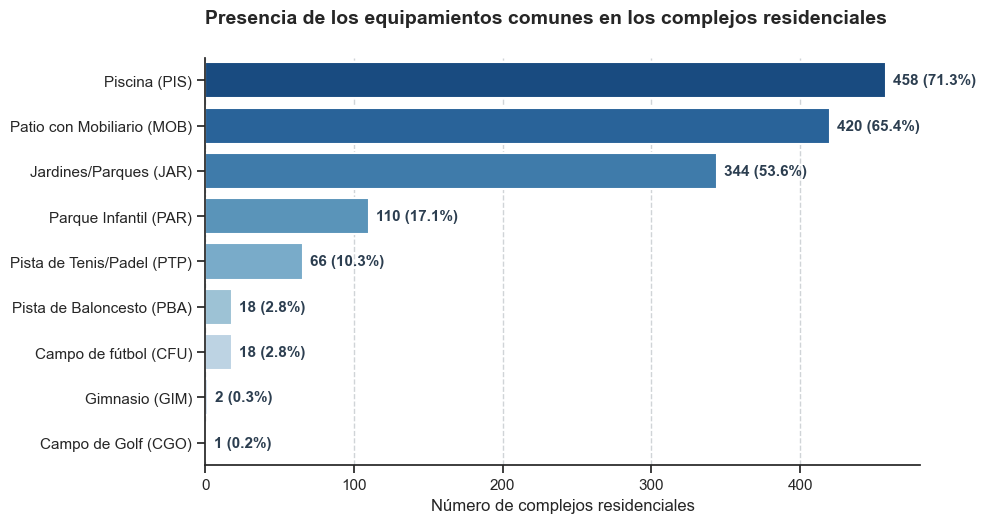

In [46]:
# Convertir las variables a entero
equip_cols = ["PIS", "PTP", "PBA", "CFU", "CGO", "GIM", "PAR", "MOB", "JAR"]
df[equip_cols] = df[equip_cols].astype(int)
# Copia de dataframe para EDA de las variables de este bloque
df_equip = df[equip_cols+["URB_label"]].copy()
plot_variable_occurrences(df_equip, equip_cols, title="Presencia de los equipamientos comunes en los complejos residenciales",
                               dict_label={
                                        "PIS": "Piscina (PIS)",
                                        "PTP": "Pista de Tenis/Padel (PTP)",
                                        "PBA": "Pista de Baloncesto (PBA)",
                                        "CFU": "Campo de fútbol (CFU)",
                                        "CGO": "Campo de Golf (CGO)",
                                        "GIM": "Gimnasio (GIM)",
                                        "PAR": "Parque Infantil (PAR)",
                                        "MOB": "Patio con Mobiliario (MOB)",
                                        "JAR": "Jardines/Parques (JAR)",
                                        })

Como se puede observar, existe una gran variedad de equipamientos comunes entre los que destacan notablemente las piscinas (**PIS**), patios con mobiliario (**MOB**) y los jardines (**JAR**).

Por sí mismos, estos elementos no presentan una relación semántica directa con el grado de cerramiento. Al analizar sus posibles asociaciones con la variable objetivo, se constata que estas son muy débiles, por lo que cualquier intento de extraer conclusiones a partir de ellas resultaría poco robusto y susceptible de conducir a correlaciones espurias. A continuación se presentan los resultados correspondientes a los tres equipamientos con mayor presencia en los complejos residenciales, donde se observa este hecho.

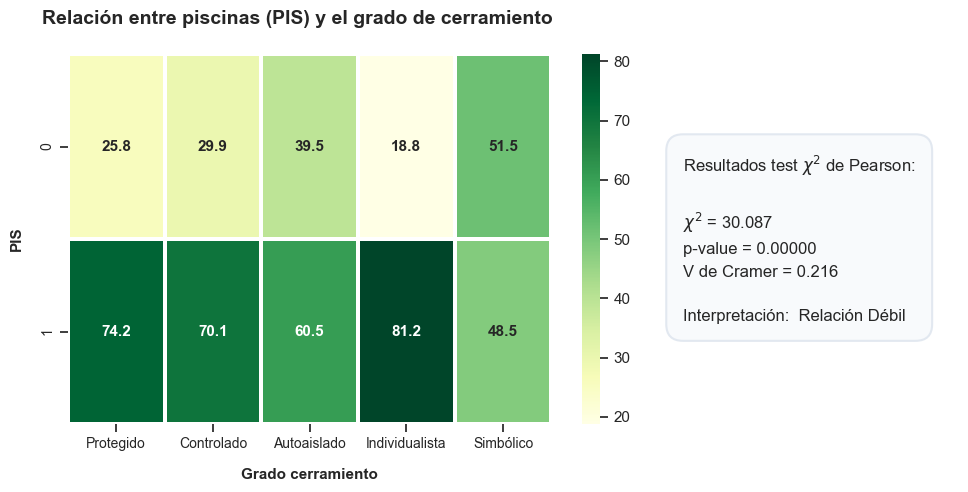

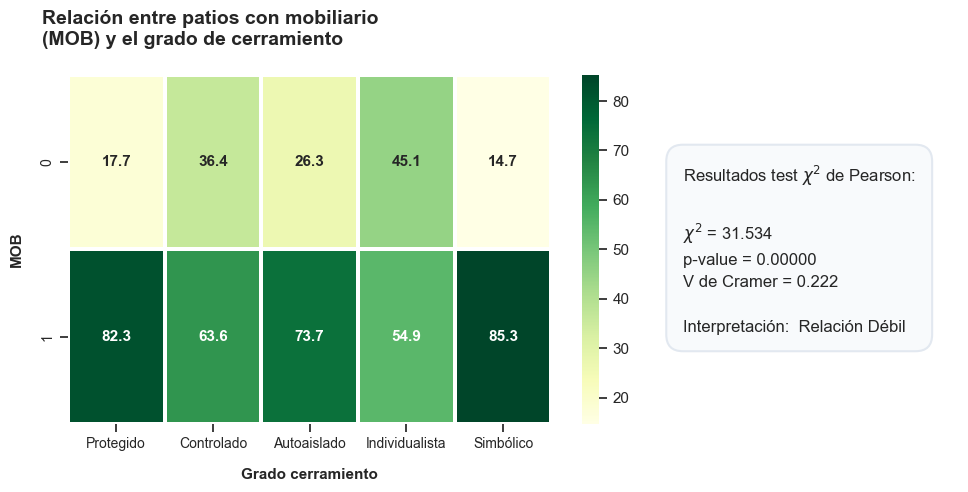

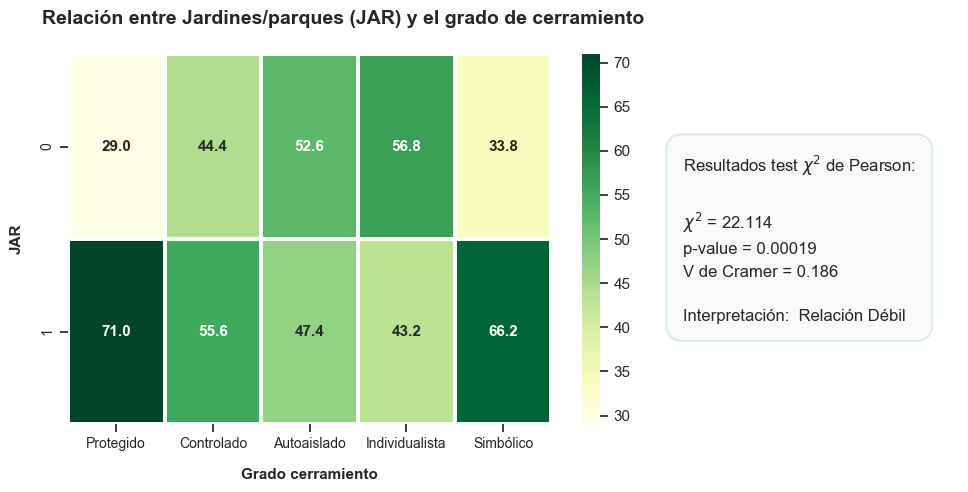

In [47]:
categorical_bivariate_analysis(df_equip, "URB_label", "PIS", "Relación entre piscinas (PIS) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_equip, "URB_label", "MOB", "Relación entre patios con mobiliario\n(MOB) y el grado de cerramiento", name_var_dep="Grado cerramiento")
categorical_bivariate_analysis(df_equip, "URB_label", "JAR", "Relación entre Jardines/parques (JAR) y el grado de cerramiento", name_var_dep="Grado cerramiento")